---
# PROJETO DATASET WINE 🍷

Dataset:. https://archive.ics.uci.edu/ml/machine-learning-databases/wine/wine.data


---

IFPE -  Campus Paulista

Curso Tecnológico em Análise e Desenvolvimento de Sistemas

Disciplina: Mineração de Dados

Relatório do Projeto da 2ª Unidade

Equipe:

*   Audemário Alves monteiro filho
*   Gaston Gouveia
*   Paola do Nascimento Rodrigues
*   Wagner Vidal Xavier da Silva



# **1. Compreensão do Negócio**

##  **a. Objetivo de Negócio**

**1. Identificação de Perfis de Vinho:** Analisar os dados para identificar padrões exclusivos de composição química que caracterizam os vinhos produzidos por cada produtor.  

**2. Otimização da Produção:** Identificar fatores específicos na composição química que estão correlacionados com a qualidade do vinho. Isso pode ajudar os produtores a otimizar seus processos de produção para melhorar a consistência e qualidade do produto final.

**3. Classificação de Produtores:** Desenvolver modelos preditivos para classificar automaticamente os vinhos de acordo com o produtor com base em suas características químicas. Isso pode ser útil para autenticação e certificação.

Obs: Decidimos, neste momento, realizar o **item 3,** que trata da **Classificação de Produtores/Classes**, devido ao tempo disponível para a conclusão do projeto.

## **b. Objetivo de Mineração: Que tarefa de mineração será realizada para atingir o objetivo de Negócio?**



Para atingir o objetivo de negócio de "Classificação de Produtores" com base nas características químicas dos vinhos, uma tarefa de mineração comumente realizada é a Classificação. A **Classificação** é uma técnica de aprendizado de máquina supervisionado, na qual um modelo é treinado para categorizar instâncias em classes ou categorias predefinidas.

Aqui estão os passos geralmente seguidos para realizar a tarefa de Classificação neste contexto:

1. **Preparação dos Dados:** Organize os dados de forma que cada instância represente um vinho e suas características químicas.
Atribua rótulos (classes) aos vinhos com base nos produtores.


2. **Divisão dos Dados:** Separe os dados em conjuntos de treinamento e teste. O conjunto de treinamento é usado para treinar o modelo, enquanto o conjunto de teste é usado para avaliar a precisão do modelo.

3. **Seleção de Características:** Identifique as características relevantes para a classificação dos produtores. Isso pode envolver uma análise exploratória para entender a importância de cada característica.

4. **Escolha do Modelo de Classificação:** Selecione um modelo de classificação adequado.

5. **Treinamento do Modelo:**Utilize o conjunto de treinamento para treinar o modelo, ajustando os parâmetros para otimizar o desempenho.

6. **Avaliação do Modelo**: Avalie o modelo usando o conjunto de teste para medir a precisão da classificação. Métricas como acurácia, precisão, recall e F1-score podem ser utilizadas dependendo das características específicas do problema.

7. **Interpretação dos Resultados:** Analise os resultados para entender como o modelo está classificando os vinhos em relação aos produtores. Isso pode incluir a análise de matrizes de confusão para identificar os erros mais comuns.

## **c. Critérios de Sucesso Mineração:**

Definimos como critério primário de sucesso a obtenção de uma devida classificação entre os produtores de vinhos presentes do dataset, nosso objetivo de negócio, que resulte em  boa acurácia e níveis aceitáveis de erros.  

A acurácia do modelo será a métrica essencial para determinar se este atribui corretamente as classes pré-determinadas aos vinhos e consequentemente se é de boa qualidade.  

Idealmente optaríamos por um benchmarking externo, analisando modelos que utilizam a mesma base de dados e compartilham das mesmas intenções quanto ao critério de sucesso para traçar pontos de referência, porém dada a aparente ausência de exemplos com o mesmo critério de sucesso, a classificação entre os produtores, optaremos por um benckmarking interno, comparando os resultados individuais do critério de sucesso entre os cinco algoritmos utilizados.

# **2.Compreensão dos dados**

1. **Introdução aos Dados:**

A base de dados utilizada é uma base de dados com 178 instâncias diferentes de vinhos, divididas em três grandes classes e mais 13 atributos que representam características químicas dos exemplares e incluem diversas medidas como teor alcoólico, ácido málico, cinzas, alcalinidade das cinzas, magnésio, fenóis totais, flavonoides, fenóis não flavonoides, proantocianidinas, intensidade de cor, matiz e OD280/OD315 de vinhos diluídos.

### Instalação e Importação das ferramentas necessárias

In [ ]:
#INSTALANDO OPTIMIZADORES
!pip install tpot
!pip install eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.4/87.4 kB 954.0 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 4.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for stopit: filename=stopit-1.1.2-py3-none-any.whl size=11937 sha256=1ea2eef7e963a12d08df2758bdaaeb2b97c236295df76965c6b79f5cc1dd2e33
  Stored in directory: /root/.cache/pip/wheels/af/f9/87/bf5b3d565c2a007b4dae9d8142dccc85a9f164e517062dd519
Successfully built stopit
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107717 sha256=e5148462ebaf6ddca5d27e89243f7d9af9a9fb1a2e51fadd94ef33b48d68abd4
  Stored in directory: /root/.cache/pip/wheels/b8/58/ef/2cf4c306898c2338d51540e0922c8e0d6028e07007085c0004
Successfully built eli5


In [ ]:
#Instalação do Pandas Profiling
!pip install --upgrade scipy

!pip install typing_extensions==4.7.1 --upgrade

!pip install ydata-profiling


  Attempting uninstall: typing_extensions
    Found existing installation: typing_extensions 4.5.0
    Uninstalling typing_extensions-4.5.0:
      Successfully uninstalled typing_extensions-4.5.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-probability 0.22.0 requires typing-extensions<4.6.0, but you have typing-extensions 4.7.1 which is incompatible.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.6/357.6 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.9/381.9 kB 29.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 11.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 44.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 26.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/

In [ ]:
# Importando bibliotecas que serão utilizadas para análise e modelagem
from ydata_profiling import ProfileReport

In [ ]:
import pandas as pd
pd.options.display.float_format = '{:.3f}'.format
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, recall_score, f1_score, confusion_matrix, classification_report, precision_recall_curve
from sklearn import svm
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.svm import SVC, LinearSVC
from sklearn.feature_selection import SelectPercentile
from sklearn.metrics import precision_score, recall_score




%matplotlib inline

In [ ]:
# Carregamento do conjunto de dados no Pandas
df = pd.read_csv('Base de dados - Wine.csv')
df.head(5)

,Alcohol,Malicacid,Ash,Alcalinity_of_ash,Magnesium,Total_phenols,Flavanoids,Nonflavanoid_phenols,Proanthocyanins,Color_intensity,Hue,0D280_0D315_of_diluted_wines,Proline,class
0,14.230,1.710,2.430,15.600,127,2.800,3.060,0.280,2.290,5.64,1.040,3.920,1065,1
1,13.200,1.780,2.140,11.200,100,2.650,2.760,0.260,1.280,4.38,1.050,3.400,1050,1
2,13.160,2.360,2.670,18.600,101,2.800,3.240,0.300,2.810,5.68,1.030,3.170,1185,1
3,14.370,1.950,2.500,16.800,113,3.850,3.490,0.240,2.180,7.8,0.860,3.450,1480,1
4,13.240,2.590,2.870,21.000,118,2.800,2.690,0.390,1.820,4.32,1.040,2.930,735,1


## **Dicionário dos dados**

1.   Alcohol: Álcool
2.   Malic acid: Ácido málico
3.   Ash: Cinzas
4.   Alcalinity of ash: Alcalinidade das cinzas
5.   Magnesium: Magnésio
6.   Total phenols: Fenóis totais
7.   Flavanoids: Flavonoides
8.   Nonflavanoid phenols: Fenóis não flavonoides
9.   Proanthocyanins: Proantocianinas
10.  Color intensity: Intensidade da cor
11.  Hue: Matiz
12.  OD280/OD315 of diluted wines: OD280/OD315 de vinhos diluídos
13.  Proline: Prolina

## Tipos de Dados

In [ ]:
# Aqui verificamos quais as features obeservadas, os tipos delas(numéricas ou categórica) e se precisam de algum pré-processamento:
# Conforme observado, o dataset não precisará de estratégi para os dados ausentes, já que está todo preenchido e também podemos observar os tipos das variáveis
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Alcohol                       178 non-null    float64
 1   Malicacid                     178 non-null    float64
 2   Ash                           178 non-null    float64
 3   Alcalinity_of_ash             178 non-null    float64
 4   Magnesium                     178 non-null    int64  
 5   Total_phenols                 178 non-null    float64
 6   Flavanoids                    178 non-null    float64
 7   Nonflavanoid_phenols          178 non-null    float64
 8   Proanthocyanins               178 non-null    float64
 9   Color_intensity               178 non-null    object 
 10  Hue                           178 non-null    float64
 11  0D280_0D315_of_diluted_wines  178 non-null    float64
 12  Proline                       178 non-null    int64  
 13  class

In [ ]:
# Renomear colunas
df = df.rename(columns = {'Alcohol' : 'Alcool',	'Malicacid': 'Acido_Malico'	,'Ash': 'Cinzas','Alcalinity_of_ash': 'Alcalinidade_de_cinzas'
,'Magnesium': 'Magnesio'	,'Total_phenols': 'Total_fenois','Flavanoids': 'Flavonoides'	,'Nonflavanoid_phenols':'Fenois_não-flavanoides'
,'Proanthocyanins':'Proantocianinas','Color_intensity':'Cor_intensidade','Hue':'Tonalidade'
,'0D280_0D315_of_diluted_wines':'OD280 / OD315 de vinhos diluídos'	,'Proline':'Prolina','class':'classe'})
df.columns

Index(['Alcool', 'Acido_Malico', 'Cinzas', 'Alcalinidade_de_cinzas',
       'Magnesio', 'Total_fenois', 'Flavonoides', 'Fenois_não-flavanoides',
       'Proantocianinas', 'Cor_intensidade', 'Tonalidade',
       'OD280 / OD315 de vinhos diluídos', 'Prolina', 'classe'],
      dtype='object')

In [ ]:
print('A base de dados tem ', df.shape[0] , 'linhas e ', df.shape[1], 'colunas.')

A base de dados tem  178 linhas e  14 colunas.


Possuímos no total quatorze variáveis. Três delas, "níveis de magnésio, proline e classe", são representadas de forma qualitativa utilizando distinção por classes numéricas de tipo int64, e outra, "intensidade de cor", representada em um tipo object.  

As demais dez variáveis são de tipo numérico float64. Não possuímos dados faltantes de tipo _null_ ou _NaN_.

In [ ]:
df.shape

(178, 14)

In [ ]:
# Alguns parâmetros estatísticos da base
# Estatística descritiva de todas as colunas do DataFrame
df.describe(include = 'all')

,Alcool,Acido_Malico,Cinzas,Alcalinidade_de_cinzas,Magnesio,Total_fenois,Flavonoides,Fenois_não-flavanoides,Proantocianinas,Cor_intensidade,Tonalidade,OD280 / OD315 de vinhos diluídos,Prolina,classe
count,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178,178.000,178.000,178.000,178.000
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,132,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.6,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,NaN,NaN
mean,13.001,2.336,2.367,19.495,99.742,2.295,2.029,0.362,1.591,NaN,6.042,2.612,746.893,1.938
std,0.812,1.117,0.274,3.340,14.282,0.626,0.999,0.124,0.572,NaN,67.836,0.710,314.907,0.775
min,11.030,0.740,1.360,10.600,70.000,0.980,0.340,0.130,0.410,NaN,0.480,1.270,278.000,1.000
25%,12.362,1.603,2.210,17.200,88.000,1.742,1.205,0.270,1.250,NaN,0.782,1.938,500.500,1.000
50%,13.050,1.865,2.360,19.500,98.000,2.355,2.135,0.340,1.555,NaN,0.975,2.780,673.500,2.000
75%,13.678,3.083,2.558,21.500,107.000,2.800,2.875,0.438,1.950,NaN,1.120,3.170,985.000,3.000


  

A partir da descrição dos dados tomamos nota de algumas características iniciais relacionadas aos seus tipos, tal como se encontram.  

A variável intensidade de cores de tipo object possui 132 valores únicos, com os 46 valores possuíndo no mínimo uma repetição onde o valor mais repetido, 2.6, possui 4 repetições. Das variáveis de tipo float64 ou int64 podemos extrair informações estatisticas como média, moda e desvio padrão. Percebemos desde já que a variável tonalidade possui alto desvio padrão, por exemplo.  

Ademais, como é esperado, todos os valores possuem a mesma quantidade de linhas, tornando possível a utilização dos dados como dataset.

## Análise exploratória de Dados:

Utilização do Pandas Profiling:


In [ ]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
eda_data = df.copy()

**Compreendendo as colunas de dados:**

1. **Alcool:**   
Alcool apresenta uma distribuição normal com concentração dos valores próximos a média  
Possui alta correlação com Prolina e Classe, onde valores menores de Alcool tendem a classe 1 e valores menores tendem a classe 3.  
Distribui-se de forma quase uniforme entre as classes, sendo a classe 1 majoritária.   
...  
  
2. **Ácido Málico:**   
Acido Málico apresenta uma distribuição unimodal enviesada a esquerda.  
Possui alta correlação com Tonalidade
...  
  
3. **Cinzas:**  
Cinzas apresenta uma distribuição normal e unimodal
...  
  
4. **Alcanilidade de cinzas:**  
Alcalinidade de cinzas apresenta uma distribuição normal e unimodal.
...   
  
5. **Magnésio:**  
Marnésio apresenta uma disbribuição unimodal enviesada a esquerda.  
Possui alta correlação com Prolina.
...  
   
6. **Total de Fenois:**  
Total de Fenois apresenta uma distribuição unimodal.  
Possui alta correlação com Flavonoides, Proantocianinas, OD280/OD315 e Classe
...  
   
7. **Flavanoides:**  
Flavonoides apresenta uma distribuição bimodal enviesada a esquerda.
Possui alta correlação negativa com Fenois não Flavanoides e correlação positiva com OD280/OD315, Total de Fenois, Tonalidade e Classe
...  
  
8. **Fenois não Flavanoides:**  
Fenois não flavanoides apresenta uma distribuição unimodal levemente enviesada a esquerda.  
Possui alta correlação negativa com Flavanoides, OD280/OD315, Total de Fenois e Classe.
...  
  
9. **Proantocianinas:**  
Proantocianinas apresenta uma distribuição unimodal enviesada a esquerda.  
Possui alta correlação com Flavonoides, OD280/OD315 e Total de Fenois.
...  
  
10. **Cor Intensidade:**   
Cor Intensidade apresenta uma distribuição bimodal.
...  
  
11. **Tonalidade:**  
Tonalidade apresenta uma distribuição bimodal levemente enviesada a direita.  
Possui uma alta correlação com ácido malico e flavanoides.
...
  
12. **OD280/OD315:**  
OD280/OD315 apresenta uma distribuição bimodal levemente enviesada a direita.  
Possui alta correlação com flavanoides, proantocianinas, total de fenois e classe.
...
  
13. **Prolina:**  
Prolina apresenta uma distribuição unimodal enviesada a esquerda.  
Possui alta correlação com álcool, magnésio e classe.
...
  
14. **Classe:**  
A distribuição de classes segue uma distribuição normal, com a classe 2 sendo predominante.

Podemos concluir dessa análise que existe uma forte relação entre a quantidade de fenóis em um vinho e sua classificação.. //continuar//

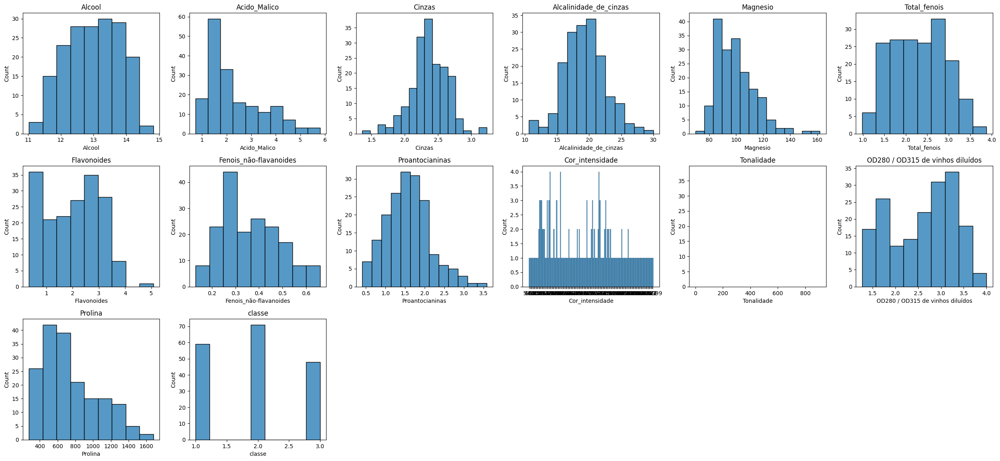

In [ ]:
#Gerando os histogramas
plt.figure(figsize= (25,15))
for i, column in enumerate(eda_data.columns):
  plt.subplot(4, 6, i +1)
  sns.histplot(data=eda_data[column])
  plt.title(column)
plt.tight_layout()
plt.show()

Correlação de dados

In [ ]:
# Exibir correlações
df.corr()

,Alcool,Acido_Malico,Cinzas,Alcalinidade_de_cinzas,Magnesio,Total_fenois,Flavonoides,Fenois_não-flavanoides,Proantocianinas,Tonalidade,OD280 / OD315 de vinhos diluídos,Prolina,classe
Alcool,1.000,0.094,0.212,-0.310,0.271,0.289,0.237,-0.156,0.137,-0.066,0.072,0.644,-0.328
Acido_Malico,0.094,1.000,0.164,0.289,-0.055,-0.335,-0.411,0.293,-0.221,-0.051,-0.369,-0.192,0.438
Cinzas,0.212,0.164,1.000,0.443,0.287,0.129,0.115,0.186,0.010,-0.043,0.004,0.224,-0.050
Alcalinidade_de_cinzas,-0.310,0.289,0.443,1.000,-0.083,-0.321,-0.351,0.362,-0.197,0.020,-0.277,-0.441,0.518
Magnesio,0.271,-0.055,0.287,-0.083,1.000,0.214,0.196,-0.256,0.236,0.017,0.066,0.393,-0.209
Total_fenois,0.289,-0.335,0.129,-0.321,0.214,1.000,0.865,-0.450,0.612,-0.142,0.700,0.498,-0.719
Flavonoides,0.237,-0.411,0.115,-0.351,0.196,0.865,1.000,-0.538,0.653,-0.074,0.787,0.494,-0.847
Fenois_não-flavanoides,-0.156,0.293,0.186,0.362,-0.256,-0.450,-0.538,1.000,-0.366,0.004,-0.503,-0.311,0.489
Proantocianinas,0.137,-0.221,0.010,-0.197,0.236,0.612,0.653,-0.366,1.000,-0.016,0.519,0.330,-0.499
Tonalidade,-0.066,-0.051,-0.043,0.020,0.017,-0.142,-0.074,0.004,-0.016,1.000,-0.082,0.030,0.004


<Axes: >

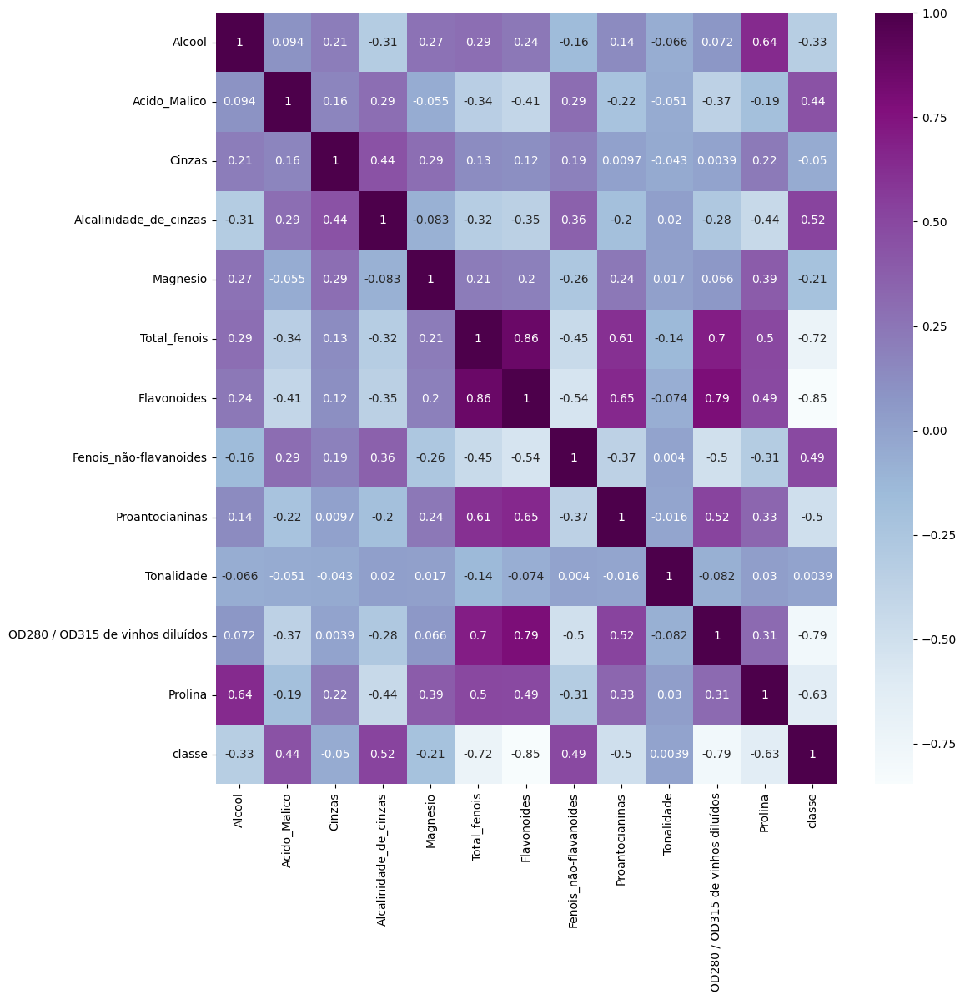

In [ ]:
# Mapa de calor - exibição das correlações
corr = df.corr()
fig, ax = plt.subplots(figsize=(12, 12))
sns.heatmap(corr, annot=True, cmap="BuPu")

In [ ]:
grouped=df.groupby(by='classe').mean()
grouped

,Alcool,Acido_Malico,Cinzas,Alcalinidade_de_cinzas,Magnesio,Total_fenois,Flavonoides,Fenois_não-flavanoides,Proantocianinas,Tonalidade,OD280 / OD315 de vinhos diluídos,Prolina
classe,,,,,,,,,,,,
1,13.745,2.011,2.456,17.037,106.339,2.840,2.982,0.290,1.899,1.062,3.158,1115.712
2,12.279,1.933,2.245,20.238,94.549,2.259,2.081,0.364,1.630,13.804,2.785,519.507
3,13.154,3.334,2.437,21.417,99.312,1.679,0.781,0.448,1.154,0.683,1.684,629.896


Abaixo esboçamos gráficos e com eles observamos a distribuição de variáveis em relação as classes quanto a seus valores:
Verificamos qual classe contem os valores mais altos e/ou baixos de cada variável, podendo cruzar essa relação com a diferença/correlação entre variáveis, váriancia e desvio padrão de cada variável. Dito isso, algumas observações que chamam atenção, a exemplo de:

1. Os valores acima de 2.0~ de ácido málico pertendem a _classe 3_  
2. Em flavonoides os valores pertencentes a _classe 3_ não passam de 1.0
3. Em tonalidade há um grande desbalanceamento nas classes, com tons acima de 1~ pertencentes a _classe 2_ exclusivamente.
4. Em prolina todos os valores acima de 700 pertencem a _classe 1_


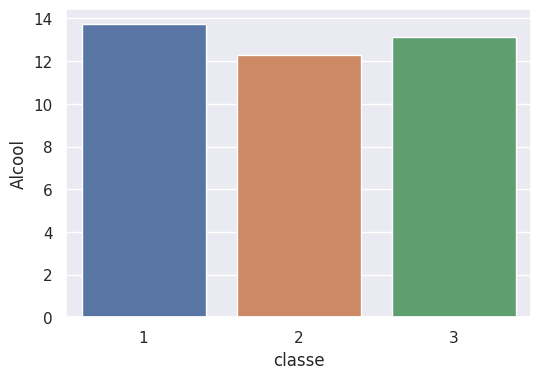

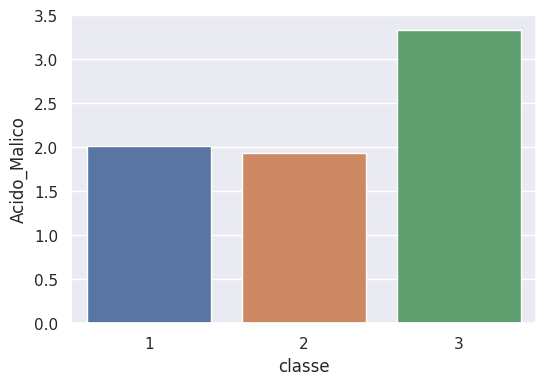

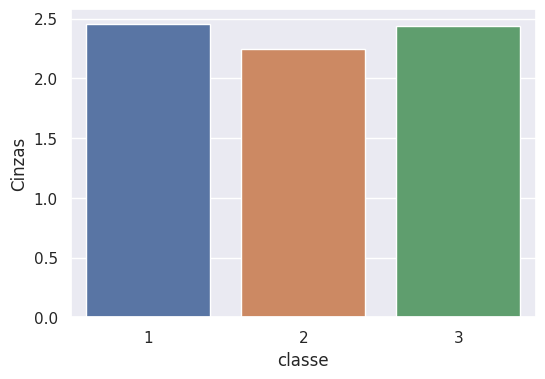

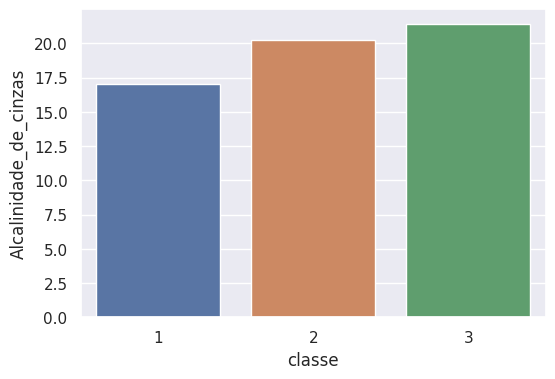

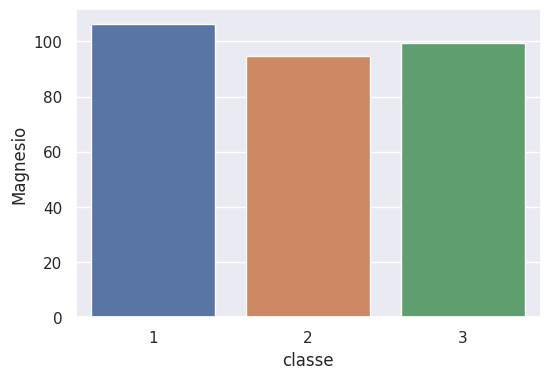

...

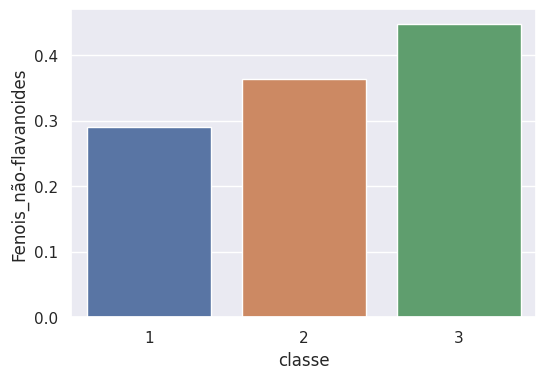

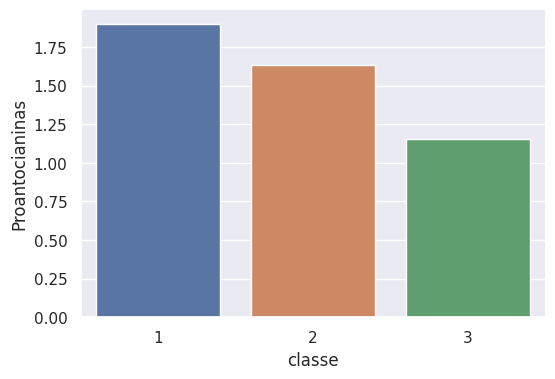

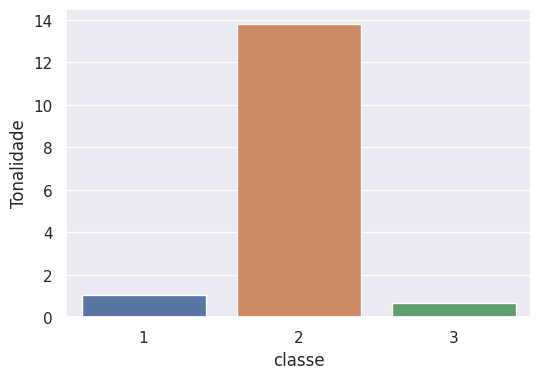

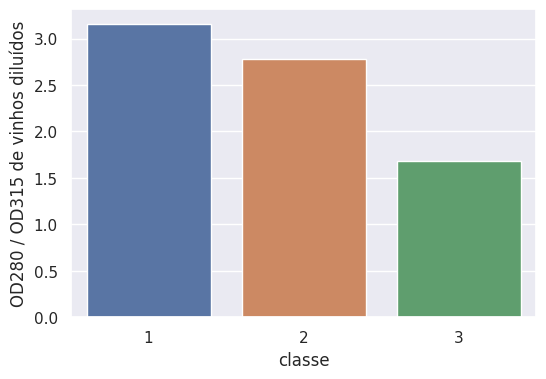

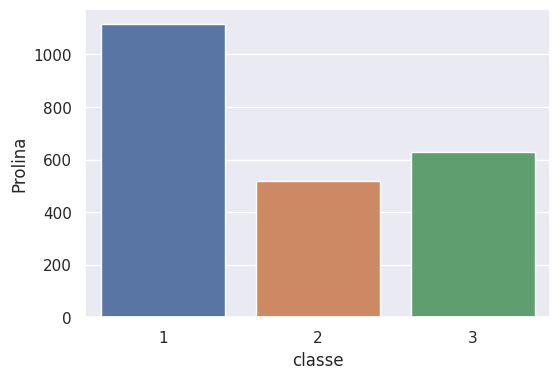

In [ ]:
sns.set()
for index,i in enumerate(grouped.columns,start=1):
    plt.figure(figsize=(6,4))
    sns.barplot(data=grouped,x=grouped.index,y=grouped[i])
    plt.show()

In [ ]:
# transformador dtypes cor_intensidade em valores categoricos
df['Cor_intensidade'] = df['Cor_intensidade'].astype('category').cat.codes

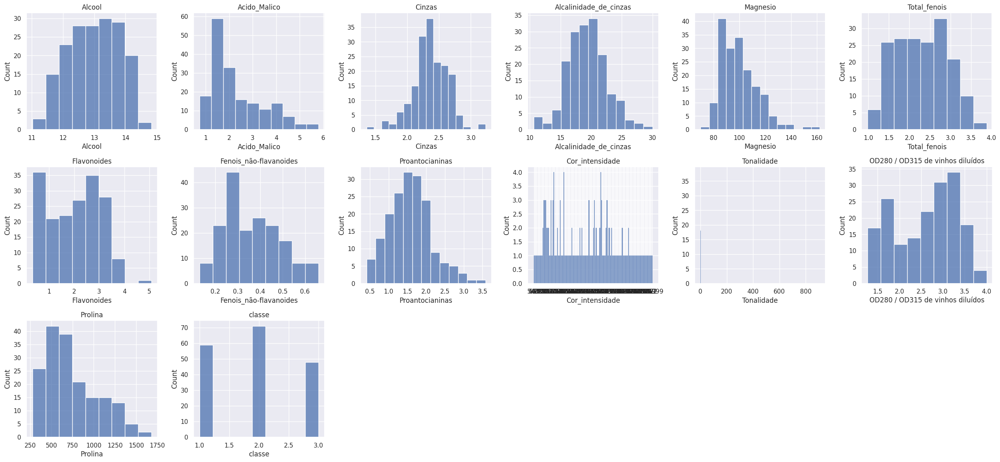

In [ ]:
#Gerando os histogramas
plt.figure(figsize= (25,15))
for i, column in enumerate(eda_data.columns):
  plt.subplot(4, 6, i +1)
  sns.histplot(data=eda_data[column])
  plt.title(column)
plt.tight_layout()
plt.show()

In [ ]:
df.describe()

,Alcool,Acido_Malico,Cinzas,Alcalinidade_de_cinzas,Magnesio,Total_fenois,Flavonoides,Fenois_não-flavanoides,Proantocianinas,Cor_intensidade,Tonalidade,OD280 / OD315 de vinhos diluídos,Prolina,classe
count,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000
mean,13.001,2.336,2.367,19.495,99.742,2.295,2.029,0.362,1.591,64.096,6.042,2.612,746.893,1.938
std,0.812,1.117,0.274,3.340,14.282,0.626,0.999,0.124,0.572,36.732,67.836,0.710,314.907,0.775
min,11.030,0.740,1.360,10.600,70.000,0.980,0.340,0.130,0.410,0.000,0.480,1.270,278.000,1.000
25%,12.362,1.603,2.210,17.200,88.000,1.742,1.205,0.270,1.250,33.000,0.782,1.938,500.500,1.000
50%,13.050,1.865,2.360,19.500,98.000,2.355,2.135,0.340,1.555,66.500,0.975,2.780,673.500,2.000
75%,13.678,3.083,2.558,21.500,107.000,2.800,2.875,0.438,1.950,93.750,1.120,3.170,985.000,3.000
max,14.830,5.800,3.230,30.000,162.000,3.880,5.080,0.660,3.580,131.000,906.000,4.000,1680.000,3.000


In [ ]:
# Calcular a matriz de correlação
df.corr()

,Alcool,Acido_Malico,Cinzas,Alcalinidade_de_cinzas,Magnesio,Total_fenois,Flavonoides,Fenois_não-flavanoides,Proantocianinas,Cor_intensidade,Tonalidade,OD280 / OD315 de vinhos diluídos,Prolina,classe
Alcool,1.000,0.094,0.212,-0.310,0.271,0.289,0.237,-0.156,0.137,0.525,-0.066,0.072,0.644,-0.328
Acido_Malico,0.094,1.000,0.164,0.289,-0.055,-0.335,-0.411,0.293,-0.221,0.170,-0.051,-0.369,-0.192,0.438
Cinzas,0.212,0.164,1.000,0.443,0.287,0.129,0.115,0.186,0.010,0.222,-0.043,0.004,0.224,-0.050
Alcalinidade_de_cinzas,-0.310,0.289,0.443,1.000,-0.083,-0.321,-0.351,0.362,-0.197,-0.102,0.020,-0.277,-0.441,0.518
Magnesio,0.271,-0.055,0.287,-0.083,1.000,0.214,0.196,-0.256,0.236,0.200,0.017,0.066,0.393,-0.209
Total_fenois,0.289,-0.335,0.129,-0.321,0.214,1.000,0.865,-0.450,0.612,0.055,-0.142,0.700,0.498,-0.719
Flavonoides,0.237,-0.411,0.115,-0.351,0.196,0.865,1.000,-0.538,0.653,0.034,-0.074,0.787,0.494,-0.847
Fenois_não-flavanoides,-0.156,0.293,0.186,0.362,-0.256,-0.450,-0.538,1.000,-0.366,-0.015,0.004,-0.503,-0.311,0.489
Proantocianinas,0.137,-0.221,0.010,-0.197,0.236,0.612,0.653,-0.366,1.000,-0.066,-0.016,0.519,0.330,-0.499
Cor_intensidade,0.525,0.170,0.222,-0.102,0.200,0.055,0.034,-0.015,-0.066,1.000,-0.128,-0.196,0.424,0.006


In [ ]:
corr = df.corr()
corr.style.background_gradient(cmap='RdBu', axis=None)

,Alcool,Acido_Malico,Cinzas,Alcalinidade_de_cinzas,Magnesio,Total_fenois,Flavonoides,Fenois_não-flavanoides,Proantocianinas,Cor_intensidade,Tonalidade,OD280 / OD315 de vinhos diluídos,Prolina,classe
Alcool,1.000000,0.094397,0.211545,-0.310235,0.270798,0.289101,0.236815,-0.155929,0.136698,0.524687,-0.066225,0.072343,0.643720,-0.328222
Acido_Malico,0.094397,1.000000,0.164045,0.288500,-0.054575,-0.335167,-0.411007,0.292977,-0.220746,0.170367,-0.050902,-0.368710,-0.192011,0.437776
Cinzas,0.211545,0.164045,1.000000,0.443367,0.286587,0.128980,0.115077,0.186230,0.009652,0.221635,-0.043257,0.003911,0.223626,-0.049643
Alcalinidade_de_cinzas,-0.310235,0.288500,0.443367,1.000000,-0.083333,-0.321113,-0.351370,0.361922,-0.197327,-0.102123,0.019506,-0.276769,-0.440597,0.517859
Magnesio,0.270798,-0.054575,0.286587,-0.083333,1.000000,0.214401,0.195784,-0.256294,0.236441,0.200429,0.017384,0.066004,0.393351,-0.209179
Total_fenois,0.289101,-0.335167,0.128980,-0.321113,0.214401,1.000000,0.864564,-0.449935,0.612413,0.055398,-0.142484,0.699949,0.498115,-0.719163
Flavonoides,0.236815,-0.411007,0.115077,-0.351370,0.195784,0.864564,1.000000,-0.537900,0.652692,0.034483,-0.074335,0.787194,0.494193,-0.847498
Fenois_não-flavanoides,-0.155929,0.292977,0.186230,0.361922,-0.256294,-0.449935,-0.537900,1.000000,-0.365845,-0.014968,0.004049,-0.503270,-0.311385,0.489109
Proantocianinas,0.136698,-0.220746,0.009652,-0.197327,0.236441,0.612413,0.652692,-0.365845,1.000000,-0.066477,-0.016244,0.519067,0.330417,-0.499130
Cor_intensidade,0.524687,0.170367,0.221635,-0.102123,0.200429,0.055398,0.034483,-0.014968,-0.066477,1.000000,-0.128239,-0.196234,0.424073,0.005964


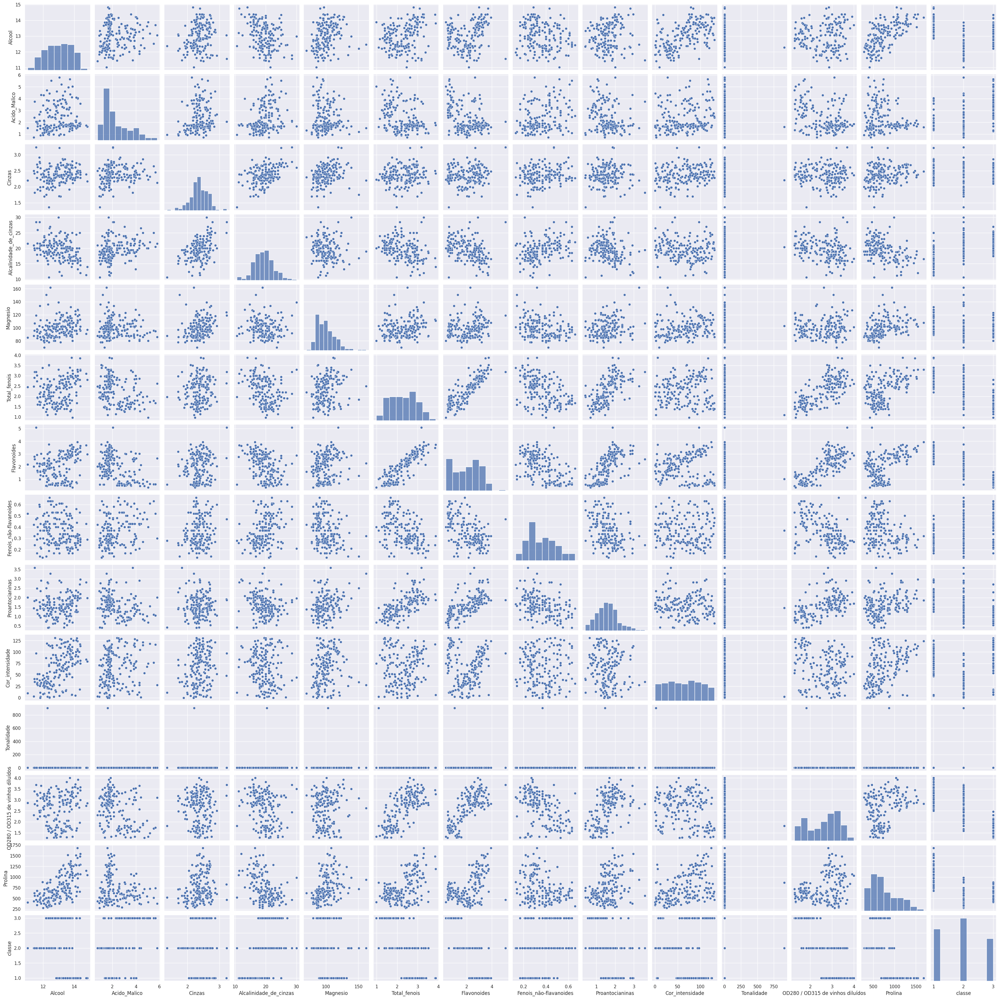

In [ ]:
#criar um conjunto de gráficos de dispersão para todas as combinações de variáveis no DataFrame
sns.pairplot(df)

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Alcool,178.000,13.001,0.812,11.030,12.362,13.050,13.678,14.830
Acido_Malico,178.000,2.336,1.117,0.740,1.603,1.865,3.083,5.800
Cinzas,178.000,2.367,0.274,1.360,2.210,2.360,2.558,3.230
Alcalinidade_de_cinzas,178.000,19.495,3.340,10.600,17.200,19.500,21.500,30.000
Magnesio,178.000,99.742,14.282,70.000,88.000,98.000,107.000,162.000
Total_fenois,178.000,2.295,0.626,0.980,1.742,2.355,2.800,3.880
Flavonoides,178.000,2.029,0.999,0.340,1.205,2.135,2.875,5.080
Fenois_não-flavanoides,178.000,0.362,0.124,0.130,0.270,0.340,0.438,0.660
Proantocianinas,178.000,1.591,0.572,0.410,1.250,1.555,1.950,3.580
Cor_intensidade,178.000,64.096,36.732,0.000,33.000,66.500,93.750,131.000


In [ ]:
group_soma = df.groupby('classe')
group_soma.sum()

,Alcool,Acido_Malico,Cinzas,Alcalinidade_de_cinzas,Magnesio,Total_fenois,Flavonoides,Fenois_não-flavanoides,Proantocianinas,Cor_intensidade,Tonalidade,OD280 / OD315 de vinhos diluídos,Prolina
classe,,,,,,,,,,,,,
1,810.940,118.630,144.880,1005.200,6274,167.570,175.960,17.110,112.060,4769,62.660,186.310,65827
2,871.790,137.220,159.380,1436.900,6713,160.380,147.740,25.820,115.750,2546,980.090,197.760,36885
3,631.380,160.020,116.980,1028.000,4767,80.580,37.510,21.480,55.370,4094,32.770,80.810,30235


# **3. Preparação dos Dados**

Durante a fase de preparação dos dados fez-se necessário a conversão dos valores de *cor intensidade* para tipos numéricos que possam ser compreendidos e utilizados pelos algoritmos assim como no processo consistênte de análise de dados.

Como investigado anteriormente, não foram encontrados valores ausentes de qualquer tipo e ainda que existam distibuições não-gausseanas e enviesadas tampouco ocorreu a necessidade de normalização.  

Quanto os valores fora de escopo, ou outliers, da forma que foram encontrados, foram considerados como ocorrências naturais e não como erros. Devido a baixa ocorrência acreditamos que não haverão impactos negativos significativos ao modelo.

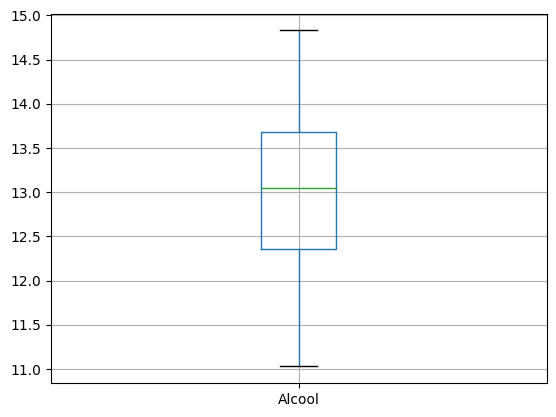

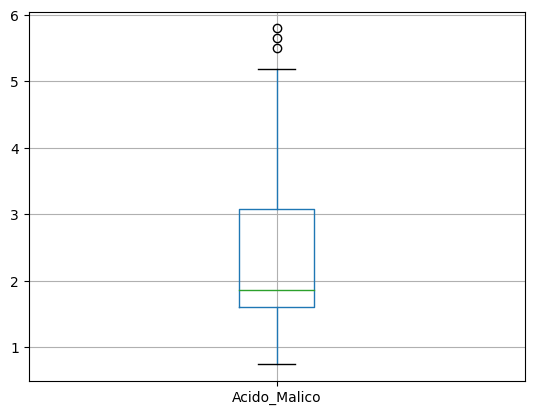

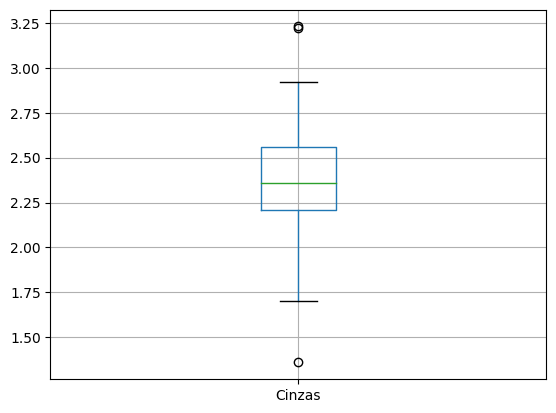

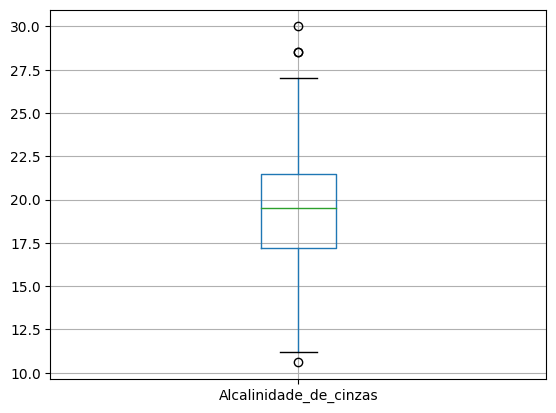

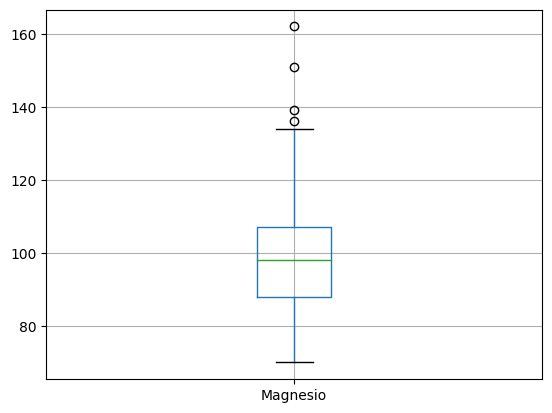

...

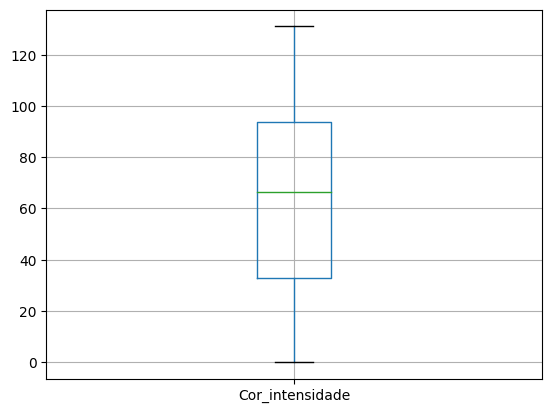

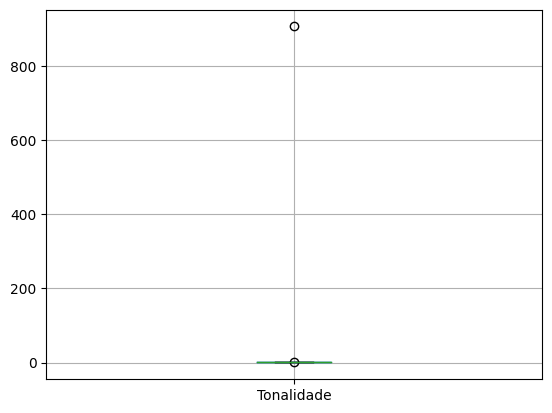

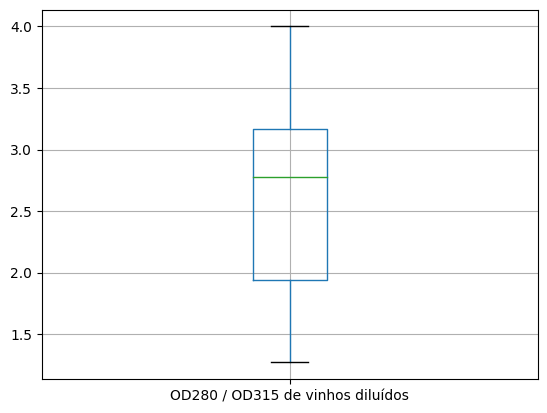

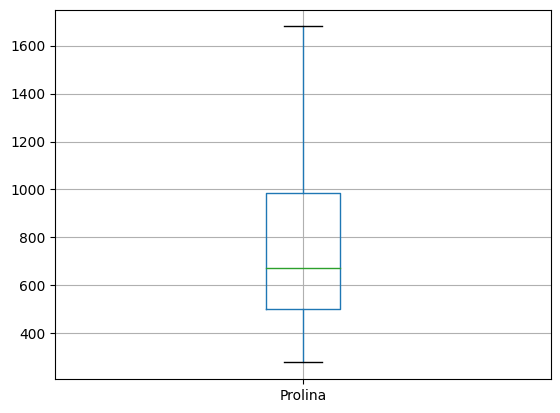

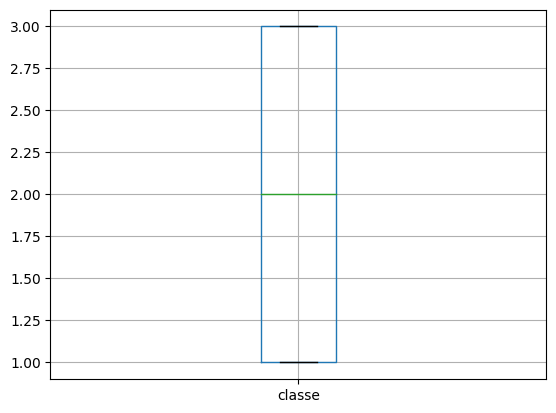

In [ ]:
#visualização rápida da presença de outliers
for column in df:
    plt.figure()
    df.boxplot([column])

# **4. Modelagem**

Dado que temos um problema de classificação, escolhemos as seguintes abordagens que atendem a este propósito:




##1. Random Forest

Técnica que costuma apresentar boa acurácia em problemas de classificação, permite avaliar o impacto das variáveis independentes, é explicável e de fácil compreensão. Por ser uma abordagem que funciona a partir da avaliação e seleção de vários classificadores, tem um custo computacional maior que técnicas mais simples, no entanto, justamente por se utilizar de várias classificações costuma ser mais asssertiva.

Os dados foram divididos em conjuntos de treinamento(70%) e teste (30%).
### Treinando o modelo no algoritmo de RandomForest

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# Inicialização do Modelo: RandomForestClassifier
modelo = RandomForestClassifier(random_state=2)

# Preparação dos Dados
# X contém todas as características, excluindo a coluna 'classe'.
# y contém apenas a coluna 'classe', que representa as classes a serem previstas.
X = df.drop(['classe'],axis=1)
y = df['classe']

# Divisão dos Dados em Conjuntos de Treinamento e Teste
# X_treino e y_treino são os conjuntos de treinamento (70% dos dados).
# X_teste e y_teste são os conjuntos de teste (30% dos dados).
# O uso de stratify=y garante que a distribuição das classes seja mantida nos conjuntos de treinamento e teste.
X_treino,X_teste, y_treino, y_teste = train_test_split(X,y, test_size=0.3, random_state=42, stratify=y)

In [ ]:
y_teste.shape

(54,)

In [ ]:
# Treinamento do Modelo
modelo.fit(X_treino,y_treino)

# Avaliação do Modelo
acuracia = modelo.score(X_teste, y_teste)

# A acurácia é uma métrica comum para avaliar o desempenho do modelo. Pode ser interpretada como a porcentagem de previsões corretas em relação ao total.
# Quanto mais próxima de 1.0, melhor é o desempenho do modelo.
print(f'Acurácia do Modelo: {acuracia}')

Acurácia do Modelo: 0.9629629629629629


<Axes: xlabel='classe', ylabel='Alcool'>

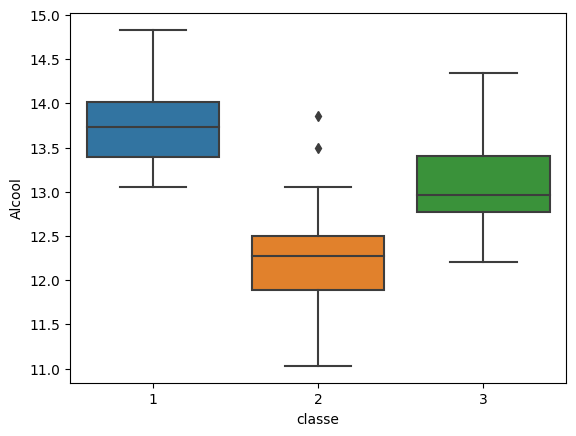

In [ ]:
sns.boxplot(X_treino, x=y_treino, y='Alcool')

Na relação de alcool e classes verificamos que os níveis  mais altos de alcool estão presentes na _classe 1_ e os níveis mais baixos na _classe 2_ onde também observamos a ocorrência de dois possíveis outliers acima de seu limite máximo.  
 Na _classe 3_ se predominam os níveis relativamente mais equilibrados de alcool. os dados contidos no intervalo intermodal parecem distintos quanto a seu nível de álcool.

Observando a distribuição e a distinção das classes quanto ao nível de alcool, podemos considerar os níveis de alcool como um bom indicador para categorizar as classes.

<Axes: xlabel='classe', ylabel='Alcool'>

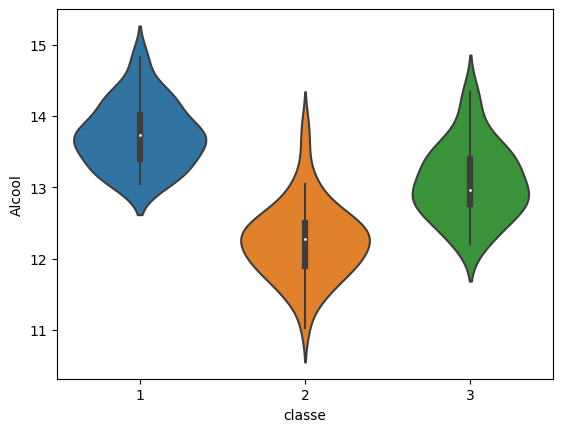

In [ ]:
sns.violinplot(X_treino, x=y_treino, y='Alcool')

No gráfico violino em todas as classes temos uma distribuição que podemos considerar unimodal. Observamos melhor onde se concentram a maior parte dos valores e adquirimos uma noção melhor sobre a relação de níveis de alcool e a categorização por classe.   

Verificamos que, mesmo que a região do segundo quartil, que concentra a maior parte dos valores daquela classe, seja distinta entra as demais (quanto ao seu nível de álcool) temos uma presença significativa de valores entre duas ou mais classes apresentando os mesmos níveis de alcool, sinificando que, embora seja um bom indicador, o nível de alcool seria capaz de determinar com boa acurácia a classe dos vinhos.

<Axes: xlabel='classe', ylabel='Flavonoides'>

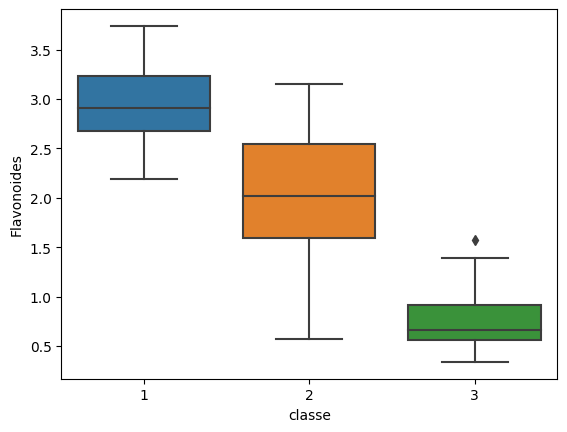

In [ ]:
sns.boxplot(X_treino, x=y_treino, y='Flavonoides')

Verificamos a distribuição e relação da classe aos níveis de Flavonoides no vinho, similar ao que fizemos com os níveis de álcool.  

Tal como nos níveis de álcool os limites intermodais também mostram a presença de uma distinção de classes para o nível de Flavonoides. Observando os limites superiores e inferiores observamos que os vinhos com maior valor de Flavonoides tendem a ser da _classe 1_ e os menores da _classe 2_

In [ ]:
correlacao = pd.concat([X_treino,y_treino],axis=1).corr()
correlacao.style.background_gradient(cmap='RdBu', axis=None)

,Alcool,Acido_Malico,Cinzas,Alcalinidade_de_cinzas,Magnesio,Total_fenois,Flavonoides,Fenois_não-flavanoides,Proantocianinas,Cor_intensidade,Tonalidade,OD280 / OD315 de vinhos diluídos,Prolina,classe
Alcool,1.000000,0.021357,0.293459,-0.289996,0.275589,0.306469,0.298518,-0.155995,0.099508,0.549376,-0.074519,0.095799,0.661101,-0.360944
Acido_Malico,0.021357,1.000000,0.137530,0.281420,-0.068105,-0.324054,-0.382074,0.289904,-0.240261,0.110465,-0.059427,-0.391928,-0.228867,0.437587
Cinzas,0.293459,0.137530,1.000000,0.451740,0.229316,0.127331,0.077286,0.232543,-0.028231,0.262025,-0.051839,-0.068568,0.230235,-0.021193
Alcalinidade_de_cinzas,-0.289996,0.281420,0.451740,1.000000,-0.079155,-0.276115,-0.371079,0.343747,-0.176951,-0.142417,0.018882,-0.277261,-0.446638,0.520649
Magnesio,0.275589,-0.068105,0.229316,-0.079155,1.000000,0.194651,0.174510,-0.261712,0.291106,0.190645,0.017765,0.033718,0.395936,-0.204154
Total_fenois,0.306469,-0.324054,0.127331,-0.276115,0.194651,1.000000,0.860019,-0.402608,0.602734,0.037105,-0.171061,0.690854,0.489970,-0.703415
Flavonoides,0.298518,-0.382074,0.077286,-0.371079,0.174510,0.860019,1.000000,-0.516563,0.638075,0.030375,-0.092011,0.774702,0.502003,-0.864511
Fenois_não-flavanoides,-0.155995,0.289904,0.232543,0.343747,-0.261712,-0.402608,-0.516563,1.000000,-0.311009,-0.002238,0.006983,-0.480884,-0.282370,0.467945
Proantocianinas,0.099508,-0.240261,-0.028231,-0.176951,0.291106,0.602734,0.638075,-0.311009,1.000000,-0.145028,-0.021835,0.482977,0.284042,-0.462894
Cor_intensidade,0.549376,0.110465,0.262025,-0.142417,0.190645,0.037105,0.030375,-0.002238,-0.145028,1.000000,-0.149452,-0.201203,0.435000,-0.037370


In [ ]:
modelo = RandomForestClassifier(random_state=2)
modelo.fit(X_treino,y_treino)
print(f'Score: {modelo.score(X_teste,y_teste)}')
importancia = pd.DataFrame({'colunas':X_treino.columns,'importancia':modelo.feature_importances_})

Score: 0.9629629629629629


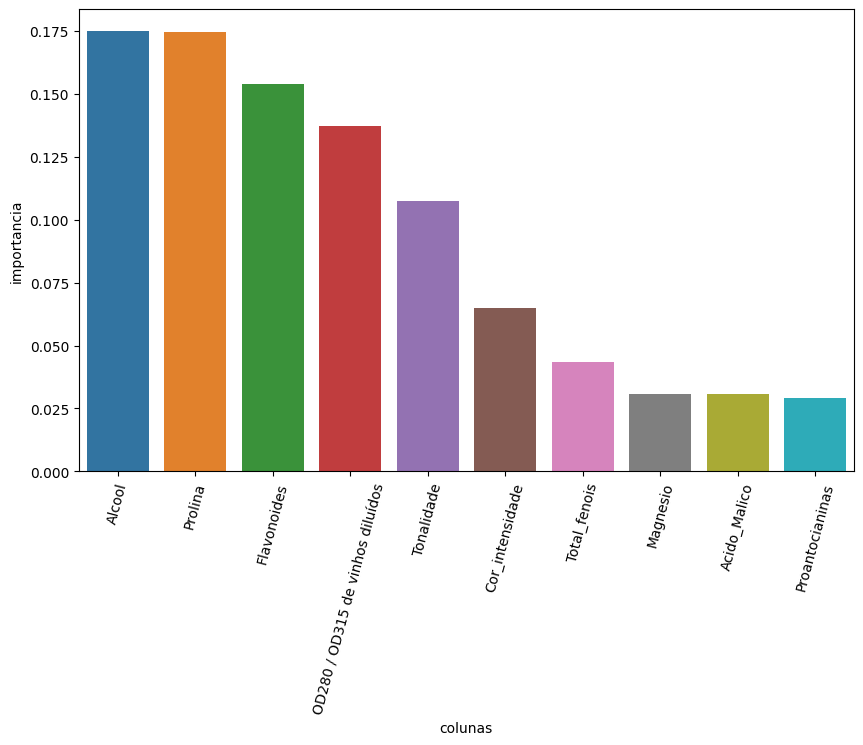

In [ ]:
importancia_10 = importancia.sort_values(by="importancia", ascending=False).head(10)
plt.figure(figsize=(10,6))
ax = sns.barplot(x='colunas',y='importancia',data=importancia_10)
ax.set_xticklabels(ax.get_xticklabels(), rotation=75);

Por fim visualizamos o grau de importância das variáveis para a classificação. Evidenciamos que Alcool e Flavonoides possuem alta relevância para a determinação das classes, algo que pode ser verificado anteriormente.  

Verificamos, por exemplo, que Total de Fenois possui uma importância relativamente baixa para a classificação, mesmo que possua alto grau de correlação com Flavonoides que tem alto grau de importância e alto grau de correlação negativa com classe, nosso Target.

Usando o grau de importância podemos identificar quais variáveis são realmente significativas para a classificação, podendo assim ter uma visão mais compreensiva dos dados e se necessário realizar seleção de atributos.  
Por meio do que foi descrito e dos dados que conhecemos, concluímos que os níveis de alcool, prolina, flavonoides e OD280/OD320 são as principais variáveis necessárias para classificar vinhos entre as três classes de vinhos existentes.

### Usando o KFold

A validação do modelo de classificação a partir da separação dos dados em conjunto de treino e validação faz com que o resultado seja muito dependente dessa divisão dos dados e pode ser que, de forma aleatória, o padrão dos dados de validação sejam diferentes do padrão dos dados de treinamento, levando a sorte de ter um resultado muito melhor do que a realidade ou o azar de um resultado muito pior do que a realidade.

Levando isso em consideração, é possível utilizar a validação cruzada, uma estratégia mais consistente e bem mais utilizada nos projetos de machine learning.

Na validação cruzada, ao invés de separarmos os dados em apenas treino e validação uma única vez, dividimos os dados em várias partes de mesmo tamanho. Em cada uma dessas divisões, será utilizada uma parte para validação e todas as outras para treinamento e o processo se repete até que todas as partes sejam utilizadas para validação e o restante para treinamento.

Será gerado um modelo para cada uma dessas divisões e a avaliação de desempenho será feita tirando a média da métrica de cada modelo. Isso faz com que a dependência da separação dos dados seja eliminada, já que há uma variação maior da escolha dos dados e é retirada uma média.

Geralmente são utilizadas 5 ou 10 partes, mais do que isso não é tão necessário porque necessita de um processamento maior e valores menores já mitiga o problema da escolha dos dados.

In [ ]:
# Validação Cruzada

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [ ]:
# Separando os dados em folds
kfold = KFold(n_splits = 30, shuffle=True, random_state = 5)

In [ ]:
previsores = df.iloc[:,0:13].values

In [ ]:
previsores

array([[1.423e+01, 1.710e+00, 2.430e+00, ..., 1.040e+00, 3.920e+00,
        1.065e+03],
       [1.320e+01, 1.780e+00, 2.140e+00, ..., 1.050e+00, 3.400e+00,
        1.050e+03],
       [1.316e+01, 2.360e+00, 2.670e+00, ..., 1.030e+00, 3.170e+00,
        1.185e+03],
       ...,
       [1.327e+01, 4.280e+00, 2.260e+00, ..., 5.900e-01, 1.560e+00,
        8.350e+02],
       [1.317e+01, 2.590e+00, 2.370e+00, ..., 6.000e-01, 1.620e+00,
        8.400e+02],
       [1.413e+01, 4.100e+00, 2.740e+00, ..., 6.100e-01, 1.600e+00,
        5.600e+02]])

In [ ]:
previsores.shape

(178, 13)

In [ ]:
alvo = df.iloc[:,13].values

In [ ]:
alvo.shape

(178,)

In [ ]:
## **Análise das escalas dos atributos (Escalonamento)**
df.describe()

,Alcool,Acido_Malico,Cinzas,Alcalinidade_de_cinzas,Magnesio,Total_fenois,Flavonoides,Fenois_não-flavanoides,Proantocianinas,Cor_intensidade,Tonalidade,OD280 / OD315 de vinhos diluídos,Prolina,classe
count,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000
mean,13.001,2.336,2.367,19.495,99.742,2.295,2.029,0.362,1.591,64.096,6.042,2.612,746.893,1.938
std,0.812,1.117,0.274,3.340,14.282,0.626,0.999,0.124,0.572,36.732,67.836,0.710,314.907,0.775
min,11.030,0.740,1.360,10.600,70.000,0.980,0.340,0.130,0.410,0.000,0.480,1.270,278.000,1.000
25%,12.362,1.603,2.210,17.200,88.000,1.742,1.205,0.270,1.250,33.000,0.782,1.938,500.500,1.000
50%,13.050,1.865,2.360,19.500,98.000,2.355,2.135,0.340,1.555,66.500,0.975,2.780,673.500,2.000
75%,13.678,3.083,2.558,21.500,107.000,2.800,2.875,0.438,1.950,93.750,1.120,3.170,985.000,3.000
max,14.830,5.800,3.230,30.000,162.000,3.880,5.080,0.660,3.580,131.000,906.000,4.000,1680.000,3.000


In [ ]:
# Utilizará a padronização

from sklearn.preprocessing import StandardScaler

In [ ]:
previsores_esc = StandardScaler().fit_transform(previsores)

In [ ]:
previsoresdf = pd.DataFrame(previsores_esc)
previsoresdf

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,1.519,-0.562,0.232,-1.170,1.914,0.809,1.035,-0.660,1.225,0.707,-0.074,1.848,1.013
1,0.246,-0.499,-0.828,-2.491,0.018,0.569,0.734,-0.821,-0.545,0.079,-0.074,1.113,0.965
2,0.197,0.021,1.109,-0.269,0.088,0.809,1.216,-0.498,2.136,0.762,-0.074,0.789,1.395
3,1.692,-0.347,0.488,-0.809,0.931,2.491,1.467,-0.982,1.032,1.444,-0.077,1.184,2.335
4,0.296,0.228,1.840,0.452,1.282,0.809,0.663,0.227,0.401,-0.003,-0.074,0.450,-0.038
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,0.876,2.975,0.305,0.302,-0.333,-0.986,-1.425,1.274,-0.930,1.417,-0.080,-1.231,-0.022
174,0.493,1.413,0.415,1.053,0.159,-0.793,-1.284,0.549,-0.317,1.308,-0.079,-1.485,0.010
175,0.333,1.745,-0.389,0.152,1.422,-1.130,-1.345,0.549,-0.422,-1.422,-0.081,-1.485,0.281
176,0.209,0.228,0.013,0.152,1.422,-1.034,-1.355,1.355,-0.229,1.717,-0.080,-1.401,0.296


In [ ]:
previsoresdf.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12
count,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000
mean,-0.000,-0.000,-0.000,-0.000,-0.000,0.000,-0.000,0.000,-0.000,0.000,-0.000,0.000,-0.000
std,1.003,1.003,1.003,1.003,1.003,1.003,1.003,1.003,1.003,1.003,1.003,1.003,1.003
min,-2.434,-1.433,-3.679,-2.671,-2.088,-2.107,-1.696,-1.868,-2.069,-1.750,-0.082,-1.895,-1.493
25%,-0.788,-0.659,-0.572,-0.689,-0.824,-0.885,-0.828,-0.740,-0.597,-0.849,-0.078,-0.952,-0.785
50%,0.061,-0.423,-0.024,0.002,-0.122,0.096,0.106,-0.176,-0.063,0.066,-0.075,0.238,-0.234
75%,0.836,0.670,0.698,0.602,0.510,0.809,0.849,0.610,0.629,0.810,-0.073,0.789,0.758
max,2.260,3.109,3.156,3.155,4.371,2.540,3.063,2.402,3.485,1.827,13.304,1.961,2.971


In [ ]:

# Criando o modelo
modelo_Random = RandomForestClassifier(criterion='entropy', random_state = 0, max_depth=3)
resultado_Random = cross_val_score(modelo_Random, previsores_esc, alvo, cv = kfold)

# Usamos a média e o desvio padrão
print("Acurácia Média: %.2f%%" % (resultado_Random .mean() * 100.0))

Acurácia Média: 97.56%


## 2. Árvore de decisão

Decidimos utilizar também o algoritmo de árvore de decisão, que é a base da técnica anterior. Por ser um pouco mais simples, tem um custo computacional menor, o que justifica sua escolha caso os resultados obtidos sejam satisfatórios.
O parâmetro "criterion" foi definido como "entropy" na tentativa de aumentar o ganho de informação à medida em que os nós se aprofundam, reduzindo a aleatoriedade do nó seguinte. Os conjuntos de treino e teste mantiveram a mesma proporção, 70% e 30%, respectivamente.


## Treinando o modelo no algoritmo de Árvore de Decisão

In [ ]:
# ARVORE DE DECISÃO

from sklearn.tree import DecisionTreeClassifier

In [ ]:
arvore = DecisionTreeClassifier(criterion='entropy', random_state = 0, max_depth=3)
arvore.fit(X_treino, y_treino)

DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=0)

In [ ]:
previsoes_arvore = arvore.predict(X_teste)
previsoes_arvore

array([1, 2, 1, 1, 1, 1, 3, 2, 2, 3, 3, 2, 3, 2, 1, 3, 2, 2, 3, 3, 2, 3,
       3, 3, 2, 3, 1, 1, 1, 2, 2, 2, 3, 2, 2, 3, 2, 2, 2, 1, 3, 1, 1, 1,
       1, 2, 2, 1, 3, 1, 2, 2, 3, 1])

In [ ]:
y_teste

2      1
64     2
18     1
7      1
38     1
58     1
156    3
87     2
121    2
130    3
118    2
98     2
177    3
94     2
22     1
155    3
76     2
23     1
176    3
169    3
102    2
144    3
138    3
143    3
68     2
164    3
35     1
62     2
14     1
112    2
21     1
66     2
134    3
93     2
100    2
173    3
60     2
129    2
84     2
20     1
132    3
51     1
46     1
48     1
10     1
92     2
128    2
42     1
166    3
39     1
108    2
105    2
165    3
28     1
Name: classe, dtype: int64

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [ ]:
print("Acurácia: %.2f%%" % (accuracy_score(y_teste, previsoes_arvore) * 100.0))

Acurácia: 92.59%


In [ ]:
confusion_matrix(y_teste, previsoes_arvore)

array([[16,  2,  0],
       [ 1, 19,  1],
       [ 0,  0, 15]])

In [ ]:
print(classification_report(y_teste, previsoes_arvore))

              precision    recall  f1-score   support

           1       0.94      0.89      0.91        18
           2       0.90      0.90      0.90        21
           3       0.94      1.00      0.97        15

    accuracy                           0.93        54
   macro avg       0.93      0.93      0.93        54
weighted avg       0.93      0.93      0.93        54



In [ ]:
#**Análise dados de treino**
previsoes_treino = arvore.predict(X_treino)
previsoes_treino

array([1, 1, 1, 1, 2, 1, 3, 2, 3, 1, 2, 2, 3, 2, 1, 1, 1, 2, 2, 1, 2, 2,
       2, 2, 2, 3, 2, 1, 3, 2, 3, 3, 1, 3, 2, 2, 2, 2, 3, 1, 1, 1, 1, 1,
       1, 2, 2, 3, 1, 3, 1, 1, 1, 3, 1, 3, 2, 2, 2, 1, 2, 1, 2, 2, 1, 3,
       2, 1, 1, 2, 2, 3, 1, 1, 3, 2, 2, 2, 3, 3, 3, 3, 2, 2, 1, 1, 2, 2,
       2, 3, 3, 2, 2, 3, 1, 1, 1, 3, 2, 3, 2, 2, 3, 1, 2, 2, 1, 2, 3, 2,
       3, 1, 3, 1, 1, 2, 2, 3, 1, 3, 2, 3, 3, 2])

In [ ]:
accuracy_score(y_treino, previsoes_treino)

1.0

In [ ]:
confusion_matrix(y_treino, previsoes_treino)

array([[41,  0,  0],
       [ 0, 50,  0],
       [ 0,  0, 33]])

In [ ]:
# Validação Cruzada

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [ ]:
# Separando os dados em folds
kfold = KFold(n_splits = 30, shuffle=True, random_state = 5)

In [ ]:
previsores = df.iloc[:,0:13].values

In [ ]:
previsores

array([[1.423e+01, 1.710e+00, 2.430e+00, ..., 1.040e+00, 3.920e+00,
        1.065e+03],
       [1.320e+01, 1.780e+00, 2.140e+00, ..., 1.050e+00, 3.400e+00,
        1.050e+03],
       [1.316e+01, 2.360e+00, 2.670e+00, ..., 1.030e+00, 3.170e+00,
        1.185e+03],
       ...,
       [1.327e+01, 4.280e+00, 2.260e+00, ..., 5.900e-01, 1.560e+00,
        8.350e+02],
       [1.317e+01, 2.590e+00, 2.370e+00, ..., 6.000e-01, 1.620e+00,
        8.400e+02],
       [1.413e+01, 4.100e+00, 2.740e+00, ..., 6.100e-01, 1.600e+00,
        5.600e+02]])

In [ ]:
previsores.shape

(178, 13)

In [ ]:
alvo = df.iloc[:,13].values

In [ ]:
alvo

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3,
       3, 3])

In [ ]:
alvo.shape

(178,)

In [ ]:
## **Análise das escalas dos atributos (Escalonamento)**
df.describe()

,Alcool,Acido_Malico,Cinzas,Alcalinidade_de_cinzas,Magnesio,Total_fenois,Flavonoides,Fenois_não-flavanoides,Proantocianinas,Cor_intensidade,Tonalidade,OD280 / OD315 de vinhos diluídos,Prolina,classe
count,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000
mean,13.001,2.336,2.367,19.495,99.742,2.295,2.029,0.362,1.591,64.096,6.042,2.612,746.893,1.938
std,0.812,1.117,0.274,3.340,14.282,0.626,0.999,0.124,0.572,36.732,67.836,0.710,314.907,0.775
min,11.030,0.740,1.360,10.600,70.000,0.980,0.340,0.130,0.410,0.000,0.480,1.270,278.000,1.000
25%,12.362,1.603,2.210,17.200,88.000,1.742,1.205,0.270,1.250,33.000,0.782,1.938,500.500,1.000
50%,13.050,1.865,2.360,19.500,98.000,2.355,2.135,0.340,1.555,66.500,0.975,2.780,673.500,2.000
75%,13.678,3.083,2.558,21.500,107.000,2.800,2.875,0.438,1.950,93.750,1.120,3.170,985.000,3.000
max,14.830,5.800,3.230,30.000,162.000,3.880,5.080,0.660,3.580,131.000,906.000,4.000,1680.000,3.000


In [ ]:
# Utilizará a padronização

from sklearn.preprocessing import StandardScaler

In [ ]:
previsores_esc = StandardScaler().fit_transform(previsores)

In [ ]:
previsoresdf = pd.DataFrame(previsores_esc)
previsoresdf

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,1.519,-0.562,0.232,-1.170,1.914,0.809,1.035,-0.660,1.225,0.707,-0.074,1.848,1.013
1,0.246,-0.499,-0.828,-2.491,0.018,0.569,0.734,-0.821,-0.545,0.079,-0.074,1.113,0.965
2,0.197,0.021,1.109,-0.269,0.088,0.809,1.216,-0.498,2.136,0.762,-0.074,0.789,1.395
3,1.692,-0.347,0.488,-0.809,0.931,2.491,1.467,-0.982,1.032,1.444,-0.077,1.184,2.335
4,0.296,0.228,1.840,0.452,1.282,0.809,0.663,0.227,0.401,-0.003,-0.074,0.450,-0.038
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,0.876,2.975,0.305,0.302,-0.333,-0.986,-1.425,1.274,-0.930,1.417,-0.080,-1.231,-0.022
174,0.493,1.413,0.415,1.053,0.159,-0.793,-1.284,0.549,-0.317,1.308,-0.079,-1.485,0.010
175,0.333,1.745,-0.389,0.152,1.422,-1.130,-1.345,0.549,-0.422,-1.422,-0.081,-1.485,0.281
176,0.209,0.228,0.013,0.152,1.422,-1.034,-1.355,1.355,-0.229,1.717,-0.080,-1.401,0.296


In [ ]:
previsoresdf.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12
count,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000,178.000
mean,-0.000,-0.000,-0.000,-0.000,-0.000,0.000,-0.000,0.000,-0.000,0.000,-0.000,0.000,-0.000
std,1.003,1.003,1.003,1.003,1.003,1.003,1.003,1.003,1.003,1.003,1.003,1.003,1.003
min,-2.434,-1.433,-3.679,-2.671,-2.088,-2.107,-1.696,-1.868,-2.069,-1.750,-0.082,-1.895,-1.493
25%,-0.788,-0.659,-0.572,-0.689,-0.824,-0.885,-0.828,-0.740,-0.597,-0.849,-0.078,-0.952,-0.785
50%,0.061,-0.423,-0.024,0.002,-0.122,0.096,0.106,-0.176,-0.063,0.066,-0.075,0.238,-0.234
75%,0.836,0.670,0.698,0.602,0.510,0.809,0.849,0.610,0.629,0.810,-0.073,0.789,0.758
max,2.260,3.109,3.156,3.155,4.371,2.540,3.063,2.402,3.485,1.827,13.304,1.961,2.971


In [ ]:
# Criando o modelo
modelo = DecisionTreeClassifier(criterion='entropy', random_state = 0, max_depth=3)
resultado = cross_val_score(modelo, previsores_esc, alvo, cv = kfold)

# Usamos a média e o desvio padrão
print("Acurácia Média: %.2f%%" % (resultado.mean() * 100.0))

Acurácia Média: 94.22%


## 3. KNN
O KNN é um algoritmo simples que não exige um treinamento explícito, sendo baseado no princípio da proximidade entre pontos de dados. Essa abordagem torna-o adaptável a relações não lineares nos dados, capturando padrões complexos de maneira eficaz. O KNN demonstra robustez em relação a outliers, (que, como visto anteriormente, foram mantidos) pois as previsões são influenciadas por uma vizinhança local, minimizando o impacto de pontos isolados.  
 Sua facilidade de atualização também se destaca, permitindo a inclusão de novos dados sem a necessidade de re-treinamento completo, sendo portanto um bom modelo para eventualidades futuras, como adição de novos dados.
### Treinando o modelo no algoritmo de KNN

In [ ]:
# **APRENDIZAGEM BASEADA EM INSTÂNCIAS (KNN)**

from sklearn.neighbors import KNeighborsClassifier

In [ ]:
knn = KNeighborsClassifier(n_neighbors=7, metric='minkowski', p=1)
knn.fit(X_treino, y_treino)

KNeighborsClassifier(n_neighbors=7, p=1)

In [ ]:
previsoes_knn = knn.predict(X_teste)
previsoes_knn

array([1, 2, 1, 1, 1, 1, 2, 2, 3, 3, 2, 2, 3, 2, 1, 3, 2, 1, 1, 3, 2, 1,
       3, 3, 2, 3, 1, 2, 1, 3, 3, 2, 3, 2, 2, 3, 2, 2, 2, 1, 3, 1, 1, 1,
       1, 2, 2, 1, 2, 1, 2, 2, 3, 1])

In [ ]:
y_teste

2      1
64     2
18     1
7      1
38     1
58     1
156    3
87     2
121    2
130    3
118    2
98     2
177    3
94     2
22     1
155    3
76     2
23     1
176    3
169    3
102    2
144    3
138    3
143    3
68     2
164    3
35     1
62     2
14     1
112    2
21     1
66     2
134    3
93     2
100    2
173    3
60     2
129    2
84     2
20     1
132    3
51     1
46     1
48     1
10     1
92     2
128    2
42     1
166    3
39     1
108    2
105    2
165    3
28     1
Name: classe, dtype: int64

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [ ]:
print("Acurácia: %.2f%%" % (accuracy_score(y_teste, previsoes_knn) * 100.0))

Acurácia: 87.04%


In [ ]:
confusion_matrix(y_teste, previsoes_knn)

array([[17,  0,  1],
       [ 0, 19,  2],
       [ 2,  2, 11]])

In [ ]:
print(classification_report(y_teste, previsoes_knn))

              precision    recall  f1-score   support

           1       0.89      0.94      0.92        18
           2       0.90      0.90      0.90        21
           3       0.79      0.73      0.76        15

    accuracy                           0.87        54
   macro avg       0.86      0.86      0.86        54
weighted avg       0.87      0.87      0.87        54



In [ ]:
previsoes_treino = knn.predict(X_treino)
previsoes_treino

array([1, 1, 1, 1, 2, 1, 3, 2, 3, 1, 2, 2, 3, 2, 1, 1, 1, 1, 2, 1, 2, 2,
       2, 1, 2, 1, 2, 1, 3, 2, 2, 3, 1, 3, 2, 2, 2, 3, 3, 1, 1, 1, 1, 1,
       1, 2, 2, 3, 2, 3, 2, 1, 1, 3, 1, 2, 2, 2, 2, 1, 2, 1, 2, 2, 1, 3,
       2, 1, 1, 2, 1, 3, 1, 1, 3, 2, 2, 2, 3, 3, 3, 3, 2, 2, 1, 1, 2, 2,
       2, 3, 2, 2, 2, 3, 1, 1, 1, 1, 2, 1, 2, 1, 2, 1, 2, 2, 1, 2, 3, 2,
       3, 3, 3, 1, 1, 2, 2, 3, 1, 3, 2, 3, 2, 2])

In [ ]:
accuracy_score(y_treino, previsoes_treino)

0.8709677419354839

In [ ]:
confusion_matrix(y_treino, previsoes_treino)

array([[38,  2,  1],
       [ 4, 45,  1],
       [ 3,  5, 25]])

In [ ]:
# VALIDAÇÃO CRUZADA

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [ ]:
# Separando os dados em folds
kfold = KFold(n_splits = 30, shuffle=True, random_state = 5)

In [ ]:
# Criando o modelo
modelo = KNeighborsClassifier(n_neighbors=7, metric='minkowski', p = 1)
resultado = cross_val_score(modelo, previsores_esc, alvo, cv = kfold)

# Usamos a média e o desvio padrão
print("Acurácia Média: %.2f%%" % (resultado.mean() * 100.0))

Acurácia Média: 95.44%


## 4. Regressão Logística
Escolhemos a regressão loística por sua principal vantagem, a capacidade de modelar relações lineares entre os recursos considerando a probabilidade de pertencer a uma classe específica. Isso facilita a interpretação dos coeficientes associados a cada variável, proporcionando insights sobre a contribuição relativa de cada característica para a decisão de classificação.

Além disso, a regressão logística lida bem com dados multiclasse.

### Treinando o modelo no algoritmo de Regressão Logística





In [ ]:
# **REGRESSÃO** LOGÍSTICA

from sklearn.linear_model import LogisticRegression

In [ ]:
logistica = LogisticRegression(random_state=1, max_iter=600, penalty="l2",
                               tol=0.0001, C=1,solver="lbfgs")
logistica.fit(X_treino, y_treino)

LogisticRegression(C=1, max_iter=600, random_state=1)

In [ ]:
logistica.intercept_

array([-0.1423972 ,  0.25903948, -0.11664227])

In [ ]:
logistica.coef_

array([[-3.02603355e-01,  5.39360389e-01,  4.28455048e-01,
        -3.53112937e-01, -1.66144090e-02,  2.65463622e-01,
         1.02501801e+00,  3.47266419e-02, -1.20362266e-01,
         1.17800801e-02, -6.46625300e-02,  5.13273645e-01,
         8.62357118e-03],
       [ 1.09345061e-01, -5.34275132e-01, -5.31776872e-01,
         9.47706221e-02,  2.37469332e-02, -3.07742540e-02,
         4.28640063e-01, -1.95006080e-02,  2.14485850e-01,
        -1.38767899e-02,  7.43672704e-01,  1.02530412e+00,
        -8.74337768e-03],
       [ 1.93258294e-01, -5.08525779e-03,  1.03321824e-01,
         2.58342315e-01, -7.13252425e-03, -2.34689368e-01,
        -1.45365808e+00, -1.52260339e-02, -9.41235840e-02,
         2.09670980e-03, -6.79010174e-01, -1.53857776e+00,
         1.19806504e-04]])

In [ ]:
previsoes_logistica = logistica.predict(X_teste)
previsoes_logistica

array([1, 2, 1, 1, 1, 1, 3, 2, 2, 3, 2, 2, 3, 2, 1, 3, 2, 1, 3, 3, 2, 3,
       3, 3, 2, 3, 1, 2, 1, 2, 1, 2, 3, 2, 2, 3, 3, 2, 2, 1, 3, 1, 1, 1,
       1, 2, 2, 1, 3, 1, 2, 2, 3, 1])

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [ ]:
print("Acurácia: %.2f%%" % (accuracy_score(y_teste, previsoes_logistica) * 100.0))

Acurácia: 98.15%


In [ ]:
confusion_matrix(y_teste, previsoes_logistica)

array([[18,  0,  0],
       [ 0, 20,  1],
       [ 0,  0, 15]])

In [ ]:
print(classification_report(y_teste, previsoes_logistica))

              precision    recall  f1-score   support

           1       1.00      1.00      1.00        18
           2       1.00      0.95      0.98        21
           3       0.94      1.00      0.97        15

    accuracy                           0.98        54
   macro avg       0.98      0.98      0.98        54
weighted avg       0.98      0.98      0.98        54



In [ ]:
# ANÁLISE DE DADOS DE TREINO
previsoes_treino = logistica.predict(X_treino)
previsoes_treino

array([1, 1, 1, 1, 2, 1, 3, 2, 3, 1, 2, 2, 3, 2, 1, 1, 2, 2, 2, 1, 2, 2,
       2, 1, 2, 3, 2, 1, 3, 2, 3, 3, 1, 3, 2, 2, 2, 3, 3, 1, 1, 1, 1, 1,
       1, 2, 2, 3, 2, 3, 1, 1, 1, 3, 1, 3, 2, 2, 2, 1, 2, 1, 2, 2, 1, 3,
       2, 1, 1, 2, 2, 3, 1, 1, 3, 2, 2, 2, 3, 3, 3, 3, 2, 2, 1, 1, 2, 2,
       2, 3, 3, 2, 2, 3, 1, 1, 1, 3, 2, 3, 2, 2, 3, 1, 2, 2, 1, 2, 3, 2,
       3, 1, 3, 1, 1, 2, 2, 3, 1, 3, 2, 3, 3, 2])

In [ ]:
accuracy_score(y_treino, previsoes_treino)

0.967741935483871

In [ ]:
confusion_matrix(y_treino, previsoes_treino)

array([[39,  2,  0],
       [ 1, 48,  1],
       [ 0,  0, 33]])

In [ ]:
# VALIDAÇÃO CRUZADA
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [ ]:
# Separando os dados em folds
kfold = KFold(n_splits = 30, shuffle=True, random_state = 5)

In [ ]:
# Criando o modelo
modelo = LogisticRegression(random_state=1, max_iter=600, penalty="l2",
                               tol=0.0001, C=1,solver="lbfgs")
resultado = cross_val_score(modelo, previsores_esc, alvo, cv = kfold)

# Usamos a média e o desvio padrão
print("Acurácia Média: %.2f%%" % (resultado.mean() * 100.0))

Acurácia Média: 97.78%


## 5. SVM

Uma das principais vantagens das SVM é sua eficácia em lidar com conjuntos de dados complexos. Ao buscar a melhor separação entre classes, as SVM buscam otimizar a margem entre os exemplos de treinamento, proporcionando uma generalização robusta para novos dados.
### Treinando o modelo no algoritmo de SVM

In [ ]:
# SVM (Support Vector Machine)

from sklearn.svm import SVC

In [ ]:
svm = SVC(kernel='rbf', random_state=1, C = 2)
svm.fit(X_treino, y_treino)

SVC(C=2, random_state=1)

In [ ]:
previsoes_svm = svm.predict(X_teste)
previsoes_svm

array([1, 2, 1, 1, 1, 1, 2, 2, 2, 3, 2, 3, 3, 2, 1, 3, 2, 1, 1, 3, 2, 1,
       3, 2, 3, 3, 1, 2, 1, 2, 3, 2, 3, 2, 3, 3, 3, 2, 2, 3, 3, 1, 1, 1,
       1, 2, 2, 1, 2, 3, 2, 2, 2, 1])

In [ ]:
y_teste

2      1
64     2
18     1
7      1
38     1
58     1
156    3
87     2
121    2
130    3
118    2
98     2
177    3
94     2
22     1
155    3
76     2
23     1
176    3
169    3
102    2
144    3
138    3
143    3
68     2
164    3
35     1
62     2
14     1
112    2
21     1
66     2
134    3
93     2
100    2
173    3
60     2
129    2
84     2
20     1
132    3
51     1
46     1
48     1
10     1
92     2
128    2
42     1
166    3
39     1
108    2
105    2
165    3
28     1
Name: classe, dtype: int64

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [ ]:
print("Acurácia: %.2f%%" % (accuracy_score(y_teste, previsoes_svm) * 100.0))

Acurácia: 75.93%


In [ ]:
confusion_matrix(y_teste, previsoes_svm)

array([[15,  0,  3],
       [ 0, 17,  4],
       [ 2,  4,  9]])

In [ ]:
print(classification_report(y_teste, previsoes_svm))

              precision    recall  f1-score   support

           1       0.88      0.83      0.86        18
           2       0.81      0.81      0.81        21
           3       0.56      0.60      0.58        15

    accuracy                           0.76        54
   macro avg       0.75      0.75      0.75        54
weighted avg       0.77      0.76      0.76        54



In [ ]:
# Análise dados de treino
previsoes_treino = svm.predict(X_treino)
previsoes_treino

array([1, 1, 1, 1, 2, 1, 3, 2, 3, 1, 3, 2, 2, 2, 1, 1, 3, 1, 2, 1, 2, 2,
       2, 1, 3, 3, 2, 1, 3, 2, 2, 3, 1, 2, 2, 2, 2, 2, 3, 1, 1, 1, 1, 1,
       1, 2, 2, 3, 3, 3, 3, 1, 1, 2, 1, 2, 2, 2, 3, 1, 3, 1, 3, 2, 1, 2,
       2, 1, 1, 2, 2, 3, 1, 1, 3, 2, 2, 3, 2, 2, 3, 2, 2, 2, 1, 1, 2, 2,
       2, 3, 2, 2, 2, 3, 1, 1, 1, 1, 3, 1, 2, 1, 2, 1, 2, 2, 1, 2, 3, 2,
       2, 3, 2, 1, 1, 2, 2, 3, 1, 3, 2, 2, 3, 2])

In [ ]:
accuracy_score(y_treino, previsoes_treino)

0.7580645161290323

In [ ]:
confusion_matrix(y_treino, previsoes_treino)

array([[37,  0,  4],
       [ 3, 40,  7],
       [ 2, 14, 17]])

In [ ]:
# VALIDAÇÃO CRUZADA

from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

In [ ]:
# Separando os dados em folds
kfold = KFold(n_splits = 30, shuffle=True, random_state = 5)

In [ ]:
# Criando o modelo
modelo = SVC(kernel='rbf', random_state=1, C = 2)
resultado = cross_val_score(modelo, previsores_esc, alvo, cv = kfold)

In [ ]:
# Usamos a média e o desvio padrão
print("Acurácia Média: %.2f%%" % (resultado.mean() * 100.0))

Acurácia Média: 98.89%


*Rodando* novamente o modelo com tamanho diferente

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
random_forest = RandomForestClassifier()
decision_tree = DecisionTreeClassifier()
knn = KNeighborsClassifier()
logistic_regression = LogisticRegression()
svm_model = SVC()


random_forest.fit(X_train, y_train)
decision_tree.fit(X_train, y_train)
knn.fit(X_train, y_train)
logistic_regression.fit(X_train, y_train)
svm_model.fit(X_train, y_train)

# Faça previsões nos dados de teste
rf_predictions = random_forest.predict(X_test)
dt_predictions = decision_tree.predict(X_test)
knn_predictions = knn.predict(X_test)
lr_predictions = logistic_regression.predict(X_test)
svm_predictions = svm_model.predict(X_test)

# Calcule as métricas de avaliação
rf_accuracy = accuracy_score(y_test, rf_predictions)
rf_f1 = f1_score(y_test, rf_predictions,pos_label='positive',average='micro')
rf_precision = precision_score(y_test, rf_predictions,pos_label='positive',average='micro')
rf_recall = recall_score(y_test, rf_predictions,pos_label='positive',average='micro')

dt_accuracy = accuracy_score(y_test, dt_predictions)
dt_f1 = f1_score(y_test, dt_predictions, pos_label='positive', average='micro')
dt_precision = precision_score(y_test, dt_predictions,pos_label='positive', average='micro')
dt_recall = recall_score(y_test, dt_predictions,pos_label='positive',average='micro')

knn_accuracy = accuracy_score(y_test, knn_predictions)
knn_f1 = f1_score(y_test, knn_predictions, pos_label='positive',average='micro')
knn_precision = precision_score(y_test, knn_predictions,pos_label='positive',average='micro')
knn_recall = recall_score(y_test, knn_predictions,pos_label='positive',average='micro')

lr_accuracy = accuracy_score(y_test, lr_predictions)
lr_f1 = f1_score(y_test, lr_predictions,pos_label='positive',average='micro')
lr_precision = precision_score(y_test, lr_predictions,pos_label='positive',average='micro')
lr_recall = recall_score(y_test, lr_predictions,pos_label='positive',average='micro')

svm_accuracy = accuracy_score(y_test, svm_predictions)
svm_f1 = f1_score(y_test, svm_predictions,pos_label='positive',average='micro')
svm_precision = precision_score(y_test, svm_predictions,pos_label='positive',average='micro')
svm_recall = recall_score(y_test, svm_predictions,pos_label='positive',average='micro')

# Crie a tabela com os resultados

data = {
    'Modelo': ['Random Forest', 'Árvore de Decisão', 'KNN', 'Regressão Logística', 'SVM'],
    'Acurácia': [rf_accuracy, dt_accuracy, knn_accuracy, lr_accuracy, svm_accuracy],
    'F1': [rf_f1, dt_f1, knn_f1, lr_f1, svm_f1],
    'Precisão': [rf_precision, dt_precision, knn_precision, lr_precision, svm_precision],
    'Recall': [rf_recall, dt_recall, knn_recall, lr_recall, svm_recall]
}

df = pd.DataFrame(data)
print(df)

                Modelo  Acurácia    F1  Precisão  Recall
0        Random Forest     0.972 0.972     0.972   0.972
1    Árvore de Decisão     0.889 0.889     0.889   0.889
2                  KNN     0.833 0.833     0.833   0.833
3  Regressão Logística     1.000 1.000     1.000   1.000
4                  SVM     0.833 0.833     0.833   0.833


In [ ]:
from sklearn.model_selection import KFold, cross_val_score


In [ ]:
# Defina o número de folds
num_folds = 30  # Pode ajustar conforme necessário

# Lista de modelos
models = [
    RandomForestClassifier(),
    DecisionTreeClassifier(),
    KNeighborsClassifier(),
    LogisticRegression(),
    SVC()
]

# Lista de nomes dos modelos
model_names = ['Random Forest', 'Árvore de Decisão', 'KNN', 'Regressão Logística', 'SVM']

# Lista para armazenar os resultados
results = {'Modelo': [], 'Acurácia': [], 'F1': [], 'Precisão': [], 'Recall': []}

# Loop através dos modelos
for model, name in zip(models, model_names):
    kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

    # Realize a validação cruzada e obtenha as métricas para cada fold
    accuracy = cross_val_score(model, X_train, y_train, cv=kfold, scoring='accuracy').mean()
    f1 = cross_val_score(model, X_train, y_train, cv=kfold, scoring='f1_micro').mean()
    precision = cross_val_score(model, X_train, y_train, cv=kfold, scoring='precision_micro').mean()
    recall = cross_val_score(model, X_train, y_train, cv=kfold, scoring='recall_micro').mean()

    # Armazene os resultados na lista
    results['Modelo'].append(name)
    results['Acurácia'].append(accuracy)
    results['F1'].append(f1)
    results['Precisão'].append(precision)
    results['Recall'].append(recall)

# Crie o DataFrame com os resultados
df_results = pd.DataFrame(results)
print('--------- VALIDAÇÃO CRUZADA --------------------')
print(df_results)

--------- VALIDAÇÃO CRUZADA --------------------
                Modelo  Acurácia    F1  Precisão  Recall
0        Random Forest     0.965 0.972     0.980   0.980
1    Árvore de Decisão     0.907 0.895     0.897   0.912
2                  KNN     0.795 0.795     0.795   0.795
3  Regressão Logística     0.882 0.882     0.882   0.882
4                  SVM     0.658 0.658     0.658   0.658


---
# Otimização bayesiana para otimizar os hiperparâmetros.

---

A otimização bayesiana é um método para encontrar os melhores hiperparâmetros para um modelo de aprendizado de máquina. Ela se baseia em modelos probabilísticos para modelar a função objetivo (a métrica que você está tentando otimizar) e, com base nisso, escolhe as próximas configurações de hiperparâmetros a serem avaliadas.

In [ ]:
pip install scikit-optimize

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.3/100.3 kB 1.7 MB/s eta 0:00:00


In [ ]:
from skopt import BayesSearchCV
from sklearn.model_selection import StratifiedKFold

# Defina os espaços de busca para os hiperparâmetros de cada modelo
param_spaces = {
    'Random Forest': {
        'n_estimators': (10, 100),
        'max_depth': (1, 20),
        'min_samples_split': (2, 20),
        'min_samples_leaf': (1, 10)
    },
    'Árvore de Decisão': {
        'max_depth': (1, 20),
        'min_samples_split': (2, 20),
        'min_samples_leaf': (1, 10)
    },
    'KNN': {
        'n_neighbors': (1, 20),
        'weights': ['uniform', 'distance']
    },
    'Regressão Logística': {
        'C': (1e-6, 1e+6),
        'penalty': ['l1', 'l2'],
        'solver': ['liblinear']
    },
    'SVM': {
        'C': (1e-6, 1e+6),
        'kernel': ['linear', 'rbf', 'poly'],
        'degree': (1, 3),
    }
}

# Função para otimização bayesiana usando validação cruzada
def bayesian_optimization(model_name, model, param_space, X_train, y_train):
    opt = BayesSearchCV(model, param_space, n_iter=50, n_jobs=-1, cv=StratifiedKFold(n_splits=5), scoring='accuracy')
    opt.fit(X_train, y_train)

    print(f"Melhores hiperparâmetros para {model_name}: {opt.best_params_}")
    return opt.best_estimator_

# Dicionário para armazenar os melhores modelos
best_models = {}

# Loop através dos modelos
for model, name in zip(models, model_names):
    best_model = bayesian_optimization(name, model, param_spaces[name], X_train, y_train)
    best_models[name] = best_model

# Avalie os melhores modelos nos dados de teste
results = {'Modelo': [], 'Acurácia': [], 'F1': [], 'Precisão': [], 'Recall': []}

for name, model in best_models.items():
    predictions = model.predict(X_test)
    accuracy = accuracy_score(y_test, predictions)
    f1 = f1_score(y_test, predictions, pos_label='positive', average='micro')
    precision = precision_score(y_test, predictions, pos_label='positive', average='micro')
    recall = recall_score(y_test, predictions, pos_label='positive', average='micro')

    results['Modelo'].append(name)
    results['Acurácia'].append(accuracy)
    results['F1'].append(f1)
    results['Precisão'].append(precision)
    results['Recall'].append(recall)

# Crie o DataFrame com os resultados
df_results = pd.DataFrame(results)
print(df_results)


Melhores hiperparâmetros para Random Forest: OrderedDict([('max_depth', 19), ('min_samples_leaf', 2), ('min_samples_split', 14), ('n_estimators', 12)])
Melhores hiperparâmetros para Árvore de Decisão: OrderedDict([('max_depth', 5), ('min_samples_leaf', 1), ('min_samples_split', 2)])
Melhores hiperparâmetros para KNN: OrderedDict([('n_neighbors', 10), ('weights', 'distance')])
Melhores hiperparâmetros para Regressão Logística: OrderedDict([('C', 94.99272593633907), ('penalty', 'l1'), ('solver', 'liblinear')])
Melhores hiperparâmetros para SVM: OrderedDict([('C', 807495.34345235), ('degree', 1), ('kernel', 'poly')])
                Modelo  Acurácia    F1  Precisão  Recall
0        Random Forest     0.972 0.972     0.972   0.972
1    Árvore de Decisão     0.889 0.889     0.889   0.889
2                  KNN     0.861 0.861     0.861   0.861
3  Regressão Logística     1.000 1.000     1.000   1.000
4                  SVM     1.000 1.000     1.000   1.000


A otimização bayesiana é usada em conjunto com a validação cruzada para encontrar configurações otimizadas que generalizam bem para diferentes conjuntos de dados.

# **5. Avaliação**

Os algoritmos foram avaliados com base em suas acurácias, precisão, recall e F1-score, onde a Regressão Logística emerge como a melhor alternativa:

##Acurácia
A acurácia é tida comumente como principal métrica de avaliação e nos fornece a taxa de acertos do modelo, a seguir listamos as acuácias de cada modelo:

_Usando o Algoritmo de RandomForest obtivemos uma acurácia de 96% para a primeira iteração_  
_Usando o Algoritmo de KNN obtivemos uma acurácia de 87% para a primeira iteração_  
_Usando o Algoritimo Árvore de decisão obtivemos uma acurácia de 93% para a primeira iteração_  
_Usando o Algoritmo de Regressão Logística obtivemos uma acurácia de 98% para a primeira iteração_  
_Usando o Algoritmo de SMV ovtivemos uma acurácia de 96% para a primeira iteração_  

O algoritmo de Regressão Logística obteve a mais alta acurácia, atingindo **98%** na primeira iteração, atingindo também o maior grau de acurácia na segunda iteração. A acurácia representa a proporção de previsões corretas em relação ao total de previsões. No entanto, a acurácia por si só pode ser enganadora, especialmente em conjuntos de dados desbalanceados.

##Precisão
A precisão é a proporção de verdadeiros positivos em relação ao total de predições positivas. A Regressão Logística apresentou a mais alta precisão em ambas as iterações, indicando que, quando prevê uma classe positiva, é mais provável que esteja correta. Isso é crucial em situações em que falsos positivos são indesejados.

##Recall
O recall representa a proporção de verdadeiros positivos em relação ao total de instâncias positivas no conjunto de dados. Mais uma vez, a Regressão Logística obteve o melhor desempenho em recall em ambas as iterações, indicando que consegue identificar uma alta proporção de exemplos positivos.

##F1-Score
O F1-score é a média harmônica entre precisão e recall. Fornece uma medida balanceada entre essas duas métricas. A Regressão Logística também apresentou o maior F1-score em ambas as iterações, o que reforça sua capacidade de equilibrar precisão e recall de maneira eficaz.

##Finalmente...
Em Conclusão, Algoritmo de Regressão Logística obteve não somente a maior acurácia como também a mais alta precisão, _recall_ e _f1 score_, provando assim ser o melhor modelo para essa base de dados, dado o que queríamos determinar.

-----

Em síntese, ao analisar métricas como Acurácia, Precisão, Recall e F1-Score, destaca-se que a **Regressão Logística** emerge como a opção mais apropriada para resolver este problema de classificação. Isso se deve ao seu notável desempenho e maior habilidade em explicar variações nos dados. Contudo, é crucial ponderar outros aspectos, como a complexidade do modelo, o tempo de treinamento e a interpretabilidade, no processo de escolha do modelo definitivo para uma dada problemática.

## Agradecimento pelo aprendizado , Prof. Flávio!!!! ✅::::: :